### Notebook 3-1
# Clasificación: reto normal

## Se pide:

Se deberán probar todos los modelos posibles para cada uno de los siguientes problemas de negocio, industrializando en el paquete solamente el mejor de ellos para cada uno de los casos, con los mejores hiperparámetros y transformaciones previas encontradas.

<b>Clasificación</b>:<br>
<b>Reto normal</b>:<br>
Crear un clasificador que prediga la categoría del vídeo.

## Importaciones

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter

from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

## Carga de datos
Carga del fichero de datos generado al final del EDA.

In [2]:
df = pd.read_csv('..//data//processed//csv_eda.csv', index_col=0)

In [3]:
df.columns

Index(['title', 'channel_title', 'tags', 'views', 'likes', 'dislikes',
       'comment_count', 'comments_disabled', 'ratings_disabled', 'category',
       'country', 'trending_date_year', 'trending_date_month',
       'publish_time_year', 'publish_time_month', 'ratio_viralidad',
       'ratio_interaccion_dia', 'publish_trending_days',
       'channel_title_encoded', 'tags_encoded', 'category_encoded',
       'country_encoded', 'views_encoded', 'likes_encoded', 'dislikes_encoded',
       'comment_count_encoded', 'ratio_interaccion_dia_encoded',
       'trending_date_year_encoded', 'trending_date_month_encoded',
       'publish_time_year_encoded', 'publish_time_month_encoded'],
      dtype='object')

Eliminamos la variable title, que no la vamos a usar.

In [4]:
df = df.drop('title', axis='columns')

In [5]:
df

,channel_title,tags,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,category,country,...,country_encoded,views_encoded,likes_encoded,dislikes_encoded,comment_count_encoded,ratio_interaccion_dia_encoded,trending_date_year_encoded,trending_date_month_encoded,publish_time_year_encoded,publish_time_month_encoded
0,EminemVEVO,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,False,False,Music,CA,...,0,2.195188,4.501606,1.803614,4.773962,4.334115,-1.823782,0.909091,-1.758901,0.909091
1,iDubbbzTV,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,False,False,Comedy,CA,...,0,-0.046118,0.536588,-0.020748,0.342217,0.455009,-1.823782,0.909091,-1.758901,0.909091
2,Rudy Mancuso,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,False,False,Comedy,CA,...,0,0.256091,0.646234,0.138859,0.151795,0.536320,-1.823782,0.909091,-1.758901,0.909091
3,nigahiga,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,False,False,Entertainment,CA,...,0,0.103985,0.563307,-0.007590,0.518462,0.499064,-1.823782,0.909091,-1.758901,0.909091
4,Ed Sheeran,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,False,False,Music,CA,...,0,4.467192,9.591119,0.827083,3.171140,8.064620,-1.823782,0.909091,-1.758901,0.909091
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375937,AaronsAnimals,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,2657,False,False,Pets & Animals,US,...,9,0.047033,-0.002199,-0.033994,-0.065135,-0.007461,0.548311,0.454545,0.568537,0.363636
375938,zefrank1,[none],1064798,60008,382,3936,False,False,People & Blogs,US,...,9,-0.039156,0.129129,-0.077842,-0.014908,0.106531,0.548311,0.454545,0.568537,0.363636
375939,Brad Mondo,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,3992,False,False,Entertainment,US,...,9,-0.038926,0.057358,-0.049426,-0.012709,0.048649,0.548311,0.454545,0.568537,0.363636
375940,How It Should Have Ended,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,13088,False,False,Film & Animation,US,...,9,0.598922,0.928280,0.029875,0.344494,0.850929,0.548311,0.454545,0.568537,0.363636


# Crear un clasificador que prediga la categoría del vídeo.

Nuestra variable objetivo va a ser 'category'. Vamos a comenzar estudiando esta variable y la relación de las demás variables con ella.

### Variable objetivo

<b>category</b><br>
Variable categórica nominal, 19 valores únicos.<br>
Variable muy desbalanceada.

In [6]:
df[['category']].describe()

,category
count,362283
unique,19
top,Entertainment
freq,104403


In [7]:
df['category'].value_counts(normalize=True)

category
Entertainment                                 0.288181
People & Blogs                                0.143766
Music                                         0.113847
News & Politics                               0.098583
Comedy                                        0.071715
Sports                                        0.063426
Film & Animation                              0.055473
Howto & Style                                 0.051126
Gaming                                        0.030476
Science & Technology                          0.022171
Education                                     0.021022
Autos & Vehicles                              0.012830
Pets & Animals                                0.012438
categoría no encontrada en el fichero json    0.007472
Travel & Events                               0.004712
Shows                                         0.002509
Nonprofits & Activism                         0.000157
Movies                                        0.000083
T

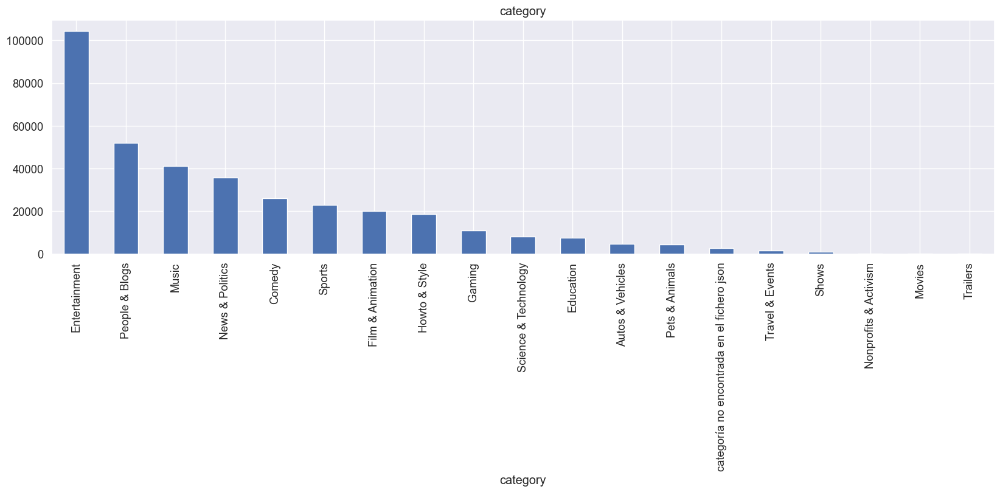

In [8]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

df['category'].value_counts().plot.bar()
plt.title('category')
plt.show()

## Variables numéricas y variable objetivo

<b>views</b><br>
La categoría con más visitas es Music, seguida a gran distancia por Nonprofits & Activism.

C:\Users\Enrique\AppData\Local\Temp\ipykernel_5332\3422106509.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


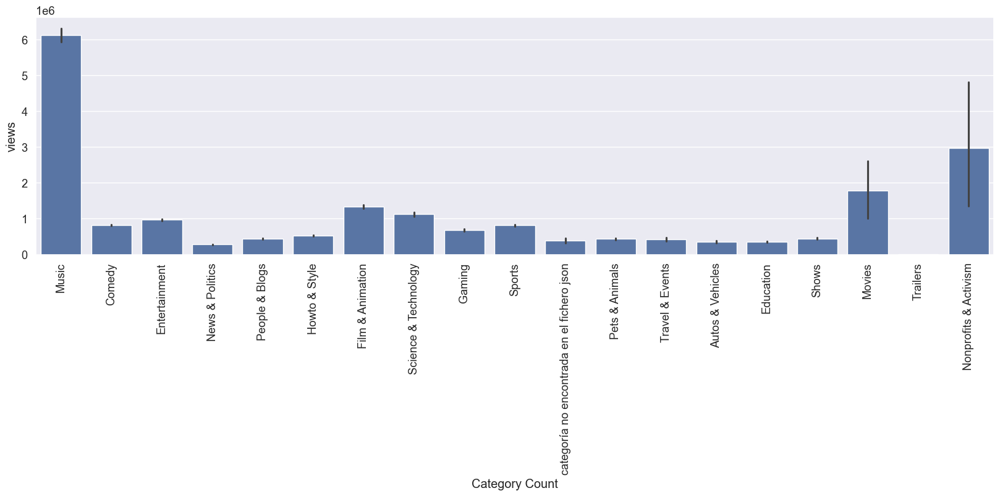

In [9]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

col = 'views'
g = sns.barplot(x='category', y=f"{col}", data=df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.xlabel('Category Count')
plt.ylabel(f'{col}')
plt.show()

<b>likes</b><br>
Nonprofits & Activism es la categoría con más likes, seguida por Music; el resto de categorías se encuentran a bastante distancia.

C:\Users\Enrique\AppData\Local\Temp\ipykernel_5332\2922381971.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


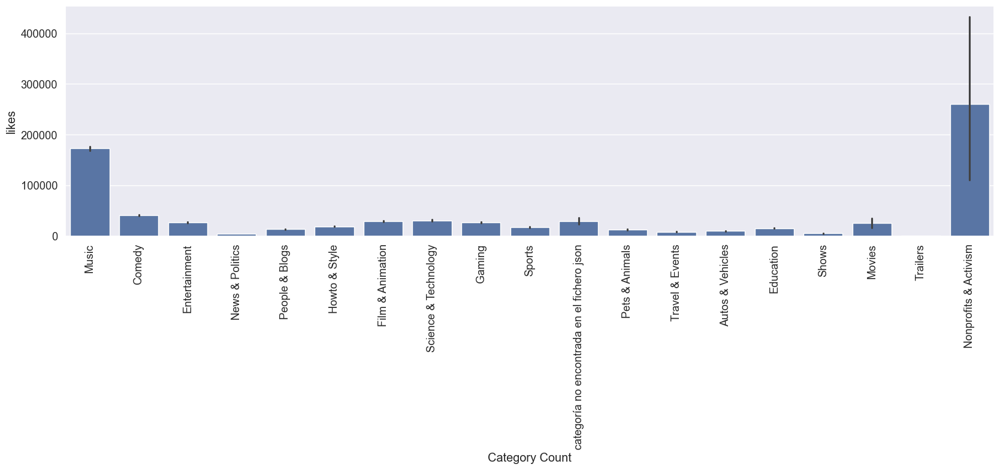

In [10]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

col = 'likes'
g = sns.barplot(x='category', y=f"{col}", data=df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.xlabel('Category Count')
plt.ylabel(f'{col}')
plt.show()

<b>dislikes</b><br>
Nonprofits & Activism es con gran diferencia la categoría que genera más dislikes.

C:\Users\Enrique\AppData\Local\Temp\ipykernel_5332\481753312.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


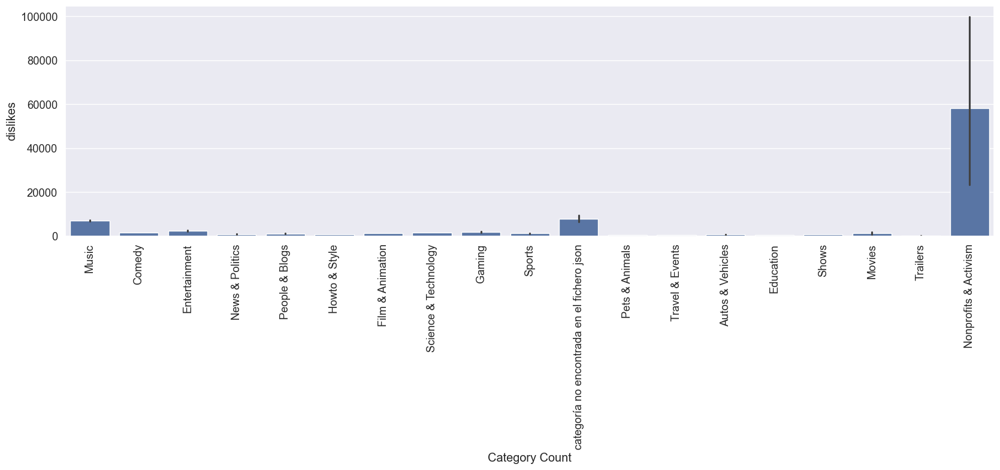

In [11]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

col = 'dislikes'
g = sns.barplot(x='category', y=f"{col}", data=df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.xlabel('Category Count')
plt.ylabel(f'{col}')
plt.show()

<b>comment_count</b><br>
Nonprofits & Activism es con diferencia la categoría que genera más comentarios.

C:\Users\Enrique\AppData\Local\Temp\ipykernel_5332\696766626.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


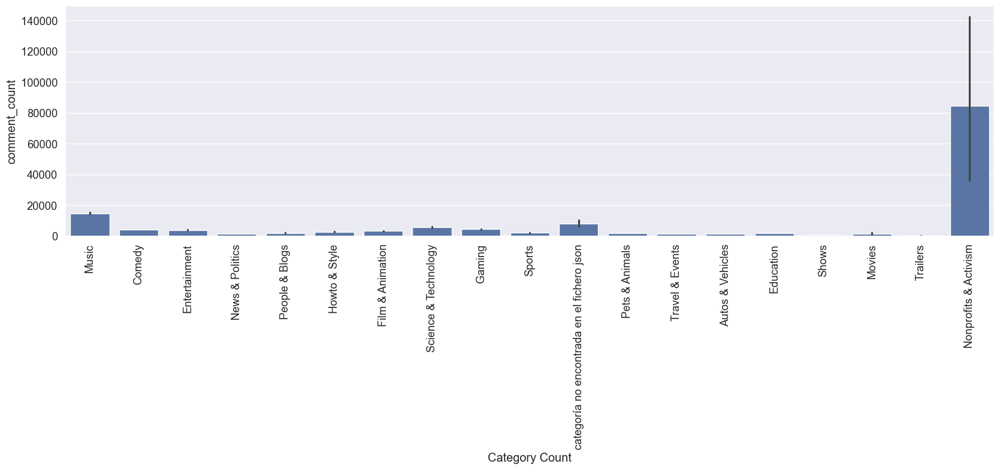

In [12]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

col = 'comment_count'
g = sns.barplot(x='category', y=f"{col}", data=df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.xlabel('Category Count')
plt.ylabel(f'{col}')
plt.show()

<b>ratio_viralidad</b><br>
No hay categorías que destaquen en viralidad, pero sí algunas con muy baja viralidad: Trailers, Shows y Movies, principalmente.

C:\Users\Enrique\AppData\Local\Temp\ipykernel_5332\91320315.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


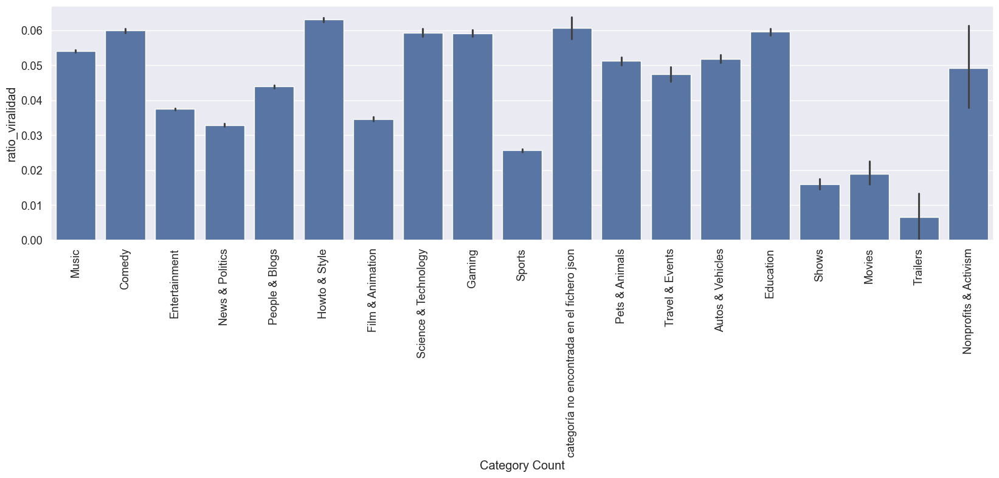

In [13]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

col = 'ratio_viralidad'
g = sns.barplot(x='category', y=f"{col}", data=df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.xlabel('Category Count')
plt.ylabel(f'{col}')
plt.show()

<b>ratio_interaccion_dia</b><br>
Destaca Nonprofits & Activism por encima de Music. El resto de categorías están muy por debajo de estas dos.

C:\Users\Enrique\AppData\Local\Temp\ipykernel_5332\2705522674.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


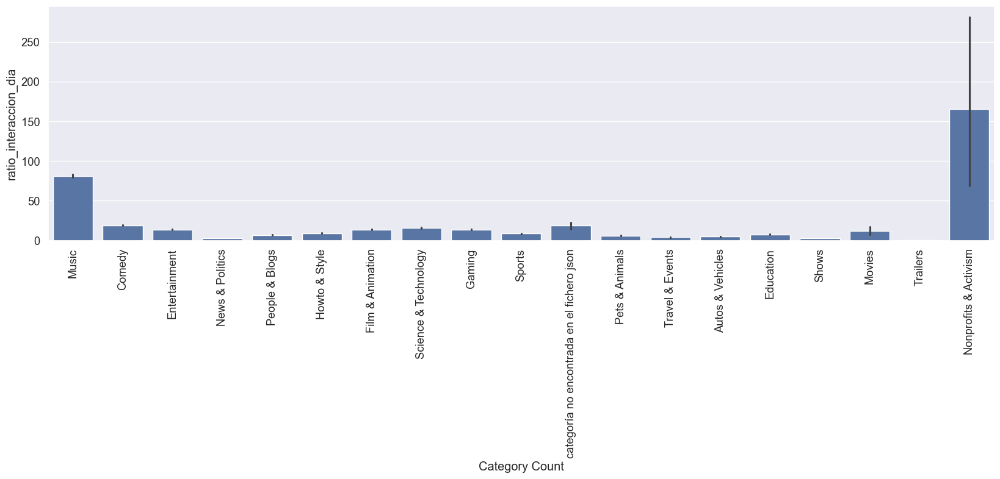

In [14]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

col = 'ratio_interaccion_dia'
g = sns.barplot(x='category', y=f"{col}", data=df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.xlabel('Category Count')
plt.ylabel(f'{col}')
plt.show()

<b>trending_date_year</b><br>

Todas las categorías han crecido en 2018 con respecto a 2017. Destaca Entertainment, la de mayor cantidad de publicaciones en tendencia y la de mayor crecimiento de un año a otro.


In [15]:
## mapa de calor
col = 'trending_date_year'
# creamos una tabla cruzada con la variable objetivo
cross_table = pd.crosstab(df[col], df['category'])
cross_table

category,Autos & Vehicles,Comedy,Education,Entertainment,Film & Animation,Gaming,Howto & Style,Movies,Music,News & Politics,Nonprofits & Activism,People & Blogs,Pets & Animals,Science & Technology,Shows,Sports,Trailers,Travel & Events,categoría no encontrada en el fichero json
trending_date_year,,,,,,,,,,,,,,,,,,,
2017,1161,6675,1912,23693,4702,2662,4404,0,8427,8398,14,12583,731,2031,272,5022,0,404,651
2018,3487,19306,5704,80710,15395,8379,14118,30,32818,27317,43,39501,3775,6001,637,17956,5,1303,2056


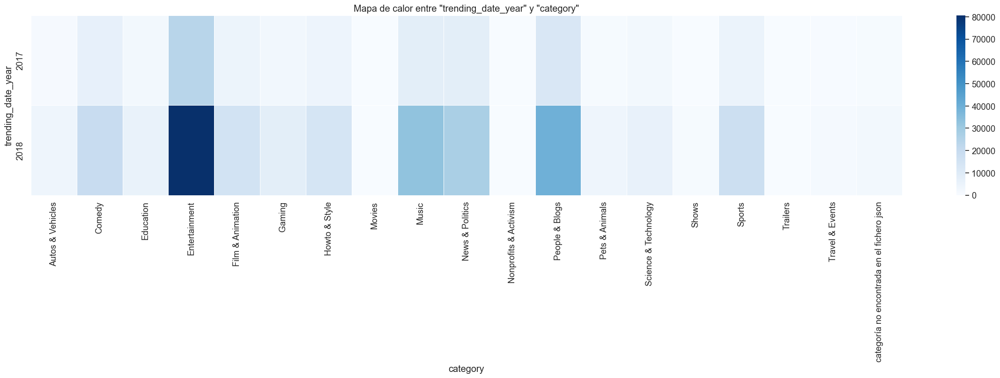

In [16]:
# graficamos el mapa de calor
plt.figure(figsize=(30, 5))
sns.heatmap(cross_table, cmap='Blues', linewidths=.5)
plt.title('Mapa de calor entre "' + col + '" y "category"')
plt.show()

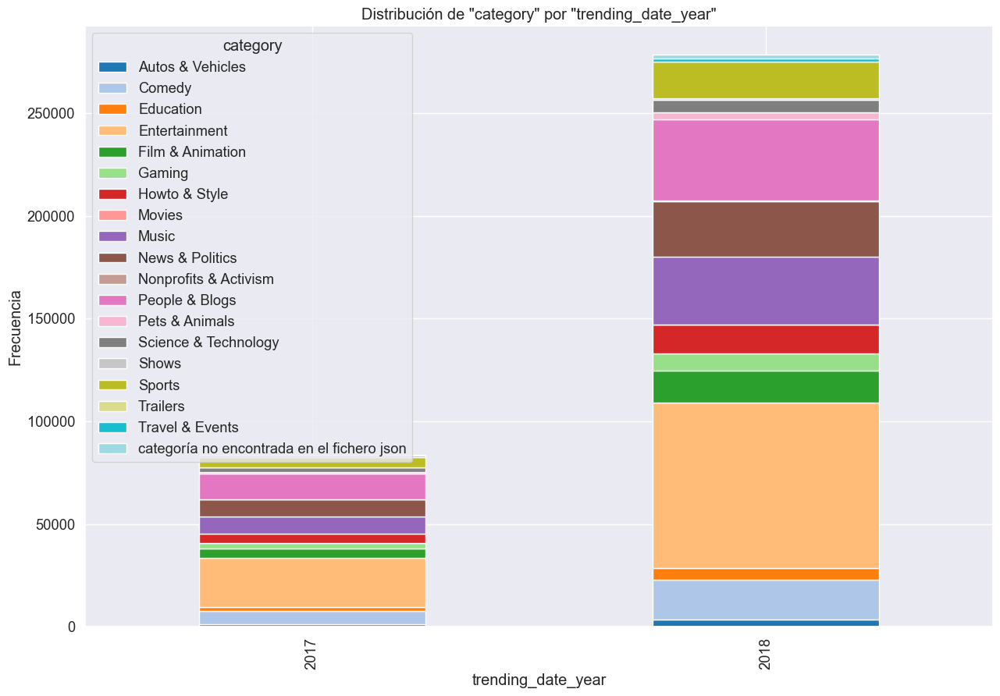

In [17]:
# gráfico de barras apiladas
col = 'trending_date_year'
cross_table.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '"')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

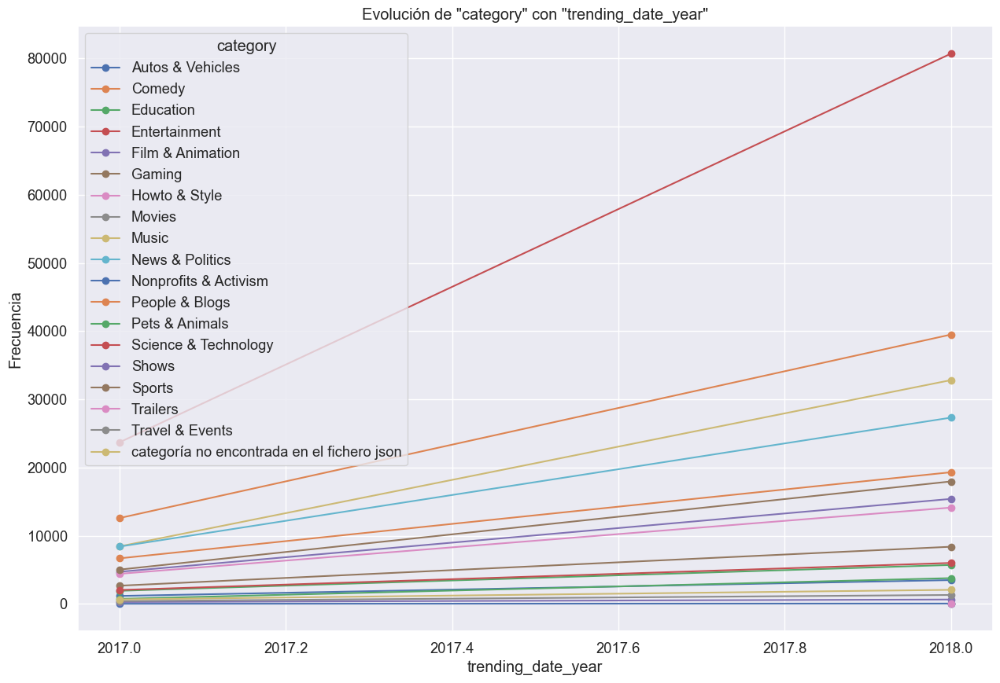

In [18]:
## gráfico de líneas por categoría
col = 'trending_date_year'
# creamos un dataframe agrupado por ambas variables
grouped = df.groupby([col, 'category']).size().unstack()
# graficamos el dataframe agrupado
grouped.plot(kind='line', figsize=(15, 10), marker='o')
plt.title('Evolución de "category" con "' + col + '"')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

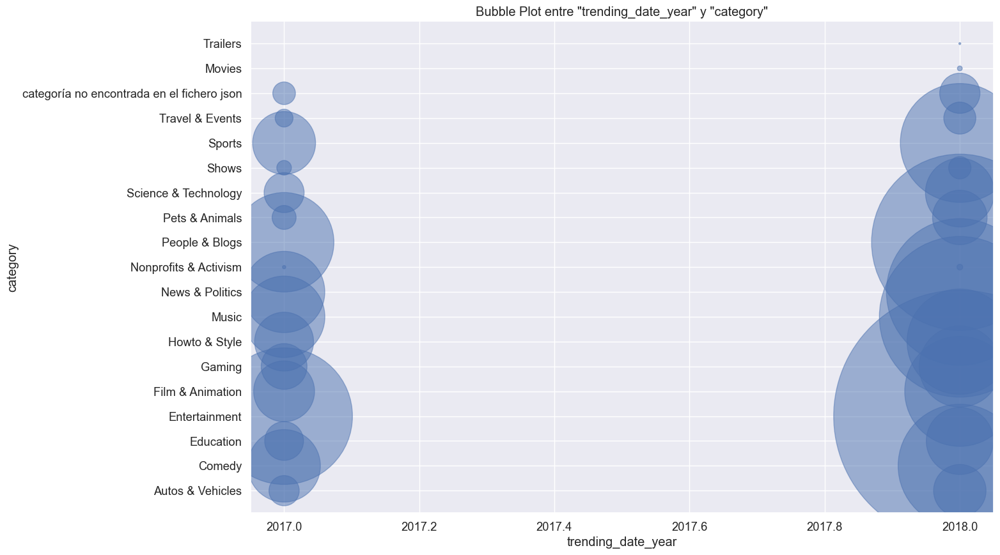

In [19]:
## gráfico de burbujas
col = 'trending_date_year'
# creamos una tabla de frecuencias
freq_table = df.groupby([col, 'category']).size().reset_index(name='counts')
# graficamos la tabla
plt.figure(figsize=(15, 10))
plt.scatter(freq_table[col], freq_table['category'], s=freq_table['counts'], alpha=0.5)
plt.title('Bubble Plot entre "' + col + '" y "category"')
plt.xlabel(col)
plt.ylabel('category')
plt.show()

<b>trending_date_month</b><br>
No hay datos de Julio a Octubre. No parece haber una pauta común en función del mes, más allá de que todas las categorías crecen en Diciembre, y suelen tener también crecimiento en Marzo y Mayo. Junio y Noviembre son los meses de menor actividad, pero puede deberse a que ambos meses estén incompletos.<br>
Como era de esperar, Entertainment es la categoría de mayor cantidad de publicaciones en tendencia.

In [20]:
## mapa de calor
col = 'trending_date_month'
# creamos una tabla cruzada con la variable objetivo
cross_table = pd.crosstab(df[col], df['category'])
cross_table

category,Autos & Vehicles,Comedy,Education,Entertainment,Film & Animation,Gaming,Howto & Style,Movies,Music,News & Politics,Nonprofits & Activism,People & Blogs,Pets & Animals,Science & Technology,Shows,Sports,Trailers,Travel & Events,categoría no encontrada en el fichero json
trending_date_month,,,,,,,,,,,,,,,,,,,
1,585,3556,1163,13963,2604,1805,2591,3,5256,5367,16,7674,615,966,97,3280,0,278,381
2,788,3386,1123,13998,2854,1299,2703,0,5256,4810,18,7676,757,1335,81,3471,2,262,406
3,738,3695,1219,16173,3114,2007,3149,0,6349,5320,0,8185,721,1257,75,3402,1,295,463
4,529,3107,846,12337,2400,1066,2069,5,5829,4405,0,6598,550,809,95,2925,0,199,321
5,592,3809,936,16683,3023,1300,2477,6,6892,5236,5,6701,770,1206,201,3244,2,183,361
6,255,1753,417,7556,1400,902,1129,16,3236,2179,4,2667,362,428,88,1634,0,86,124
11,475,2350,723,8021,1635,836,1613,0,2831,3090,1,4405,258,915,122,1988,0,141,286
12,686,4325,1189,15672,3067,1826,2791,0,5596,5308,13,8178,473,1116,150,3034,0,263,365


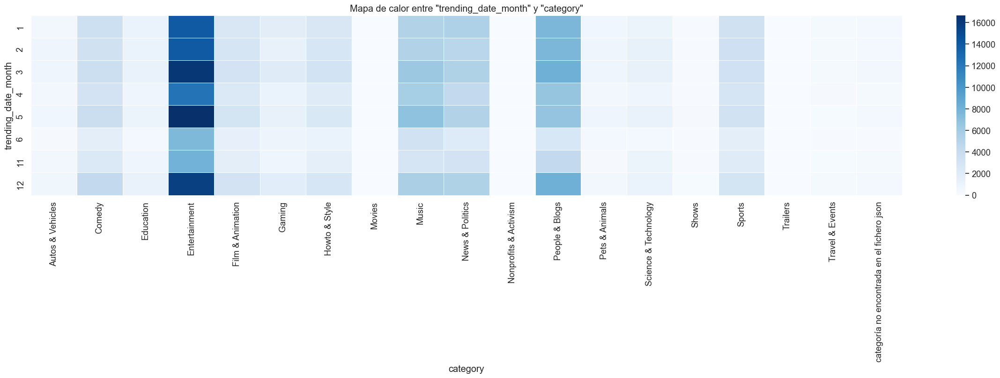

In [21]:
# graficamos el mapa de calor
plt.figure(figsize=(30, 5))
sns.heatmap(cross_table, cmap='Blues', linewidths=.5)
plt.title('Mapa de calor entre "' + col + '" y "category"')
plt.show()

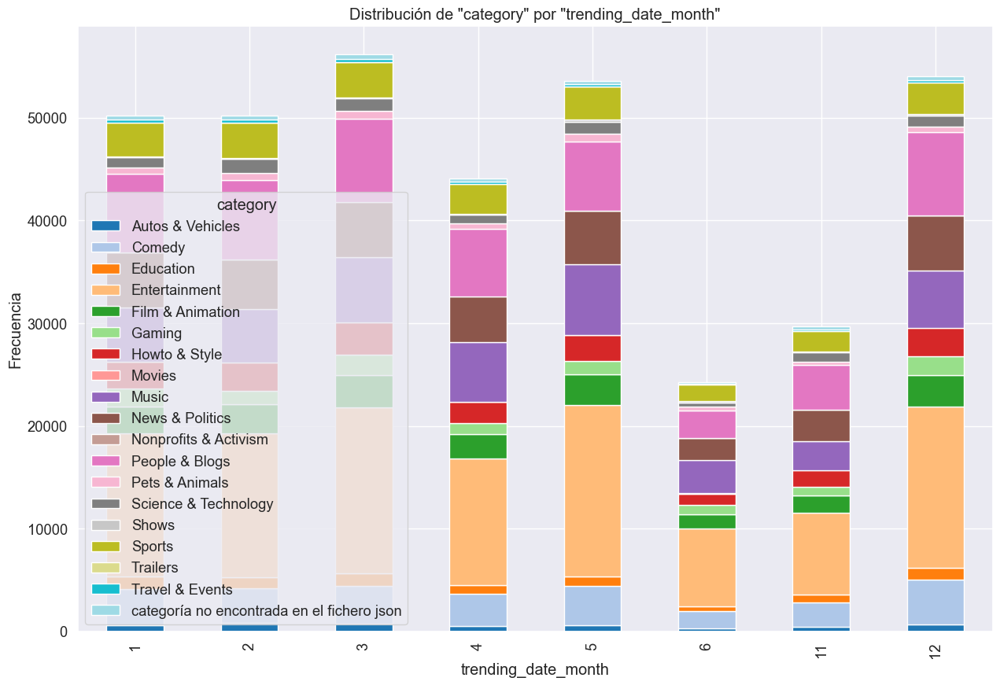

In [22]:
# gráfico de barras apiladas
col = 'trending_date_month'
cross_table.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '"')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

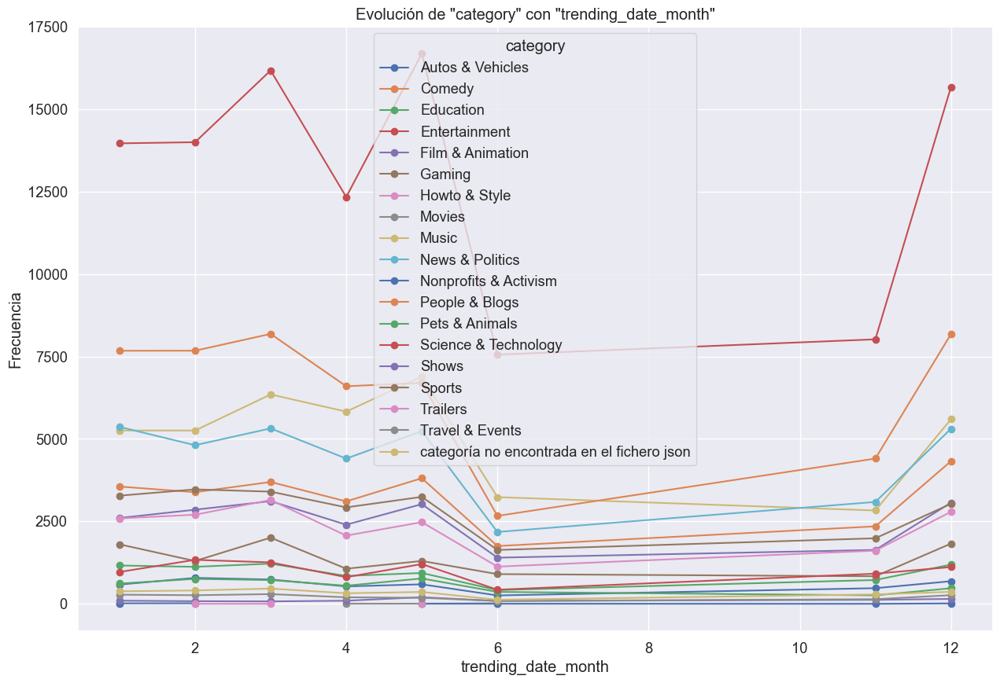

In [23]:
## gráfico de líneas por categoría
col = 'trending_date_month'
# creamos un dataframe agrupado por ambas variables
grouped = df.groupby([col, 'category']).size().unstack()
# graficamos el dataframe agrupado
grouped.plot(kind='line', figsize=(15, 10), marker='o')
plt.title('Evolución de "category" con "' + col + '"')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

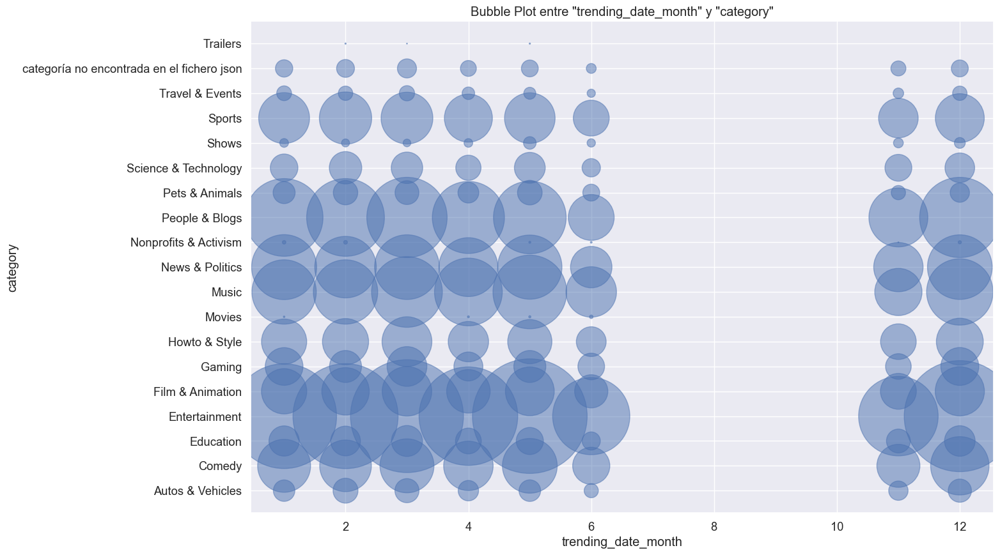

In [24]:
## gráfico de burbujas
col = 'trending_date_month'
# creamos una tabla de frecuencias
freq_table = df.groupby([col, 'category']).size().reset_index(name='counts')
# graficamos la tabla
plt.figure(figsize=(15, 10))
plt.scatter(freq_table[col], freq_table['category'], s=freq_table['counts'], alpha=0.5)
plt.title('Bubble Plot entre "' + col + '" y "category"')
plt.xlabel(col)
plt.ylabel('category')
plt.show()

<b>publish_time_year</b><br>
Antes de 2017 los valores de todas las categorías son muy bajos. Es en 2017 y 2018 cuando empieza a crecer el número de publicaciones en todas las categorías.<br>
Al igual que vimos en trending_date, Entertainment es con diferencia la categoría de más publicaciones y de mayor crecimiento de las mismas.

In [25]:
## mapa de calor
col = 'publish_time_year'
# creamos una tabla cruzada con la variable objetivo
cross_table = pd.crosstab(df[col], df['category'])
cross_table

category,Autos & Vehicles,Comedy,Education,Entertainment,Film & Animation,Gaming,Howto & Style,Movies,Music,News & Politics,Nonprofits & Activism,People & Blogs,Pets & Animals,Science & Technology,Shows,Sports,Trailers,Travel & Events,categoría no encontrada en el fichero json
publish_time_year,,,,,,,,,,,,,,,,,,,
2017,1193,7084,2014,24895,4941,2822,4655,2,9196,8713,14,13335,819,2140,279,5275,0,448,672
2018,3455,18897,5602,79508,15156,8219,13867,28,32049,27002,43,38749,3687,5892,630,17703,5,1259,2035


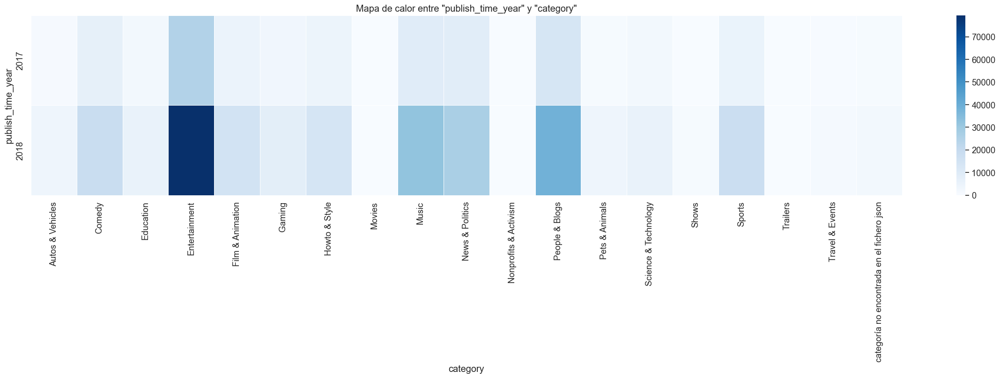

In [26]:
# graficamos el mapa de calor
plt.figure(figsize=(30, 5))
sns.heatmap(cross_table, cmap='Blues', linewidths=.5)
plt.title('Mapa de calor entre "' + col + '" y "category"')
plt.show()

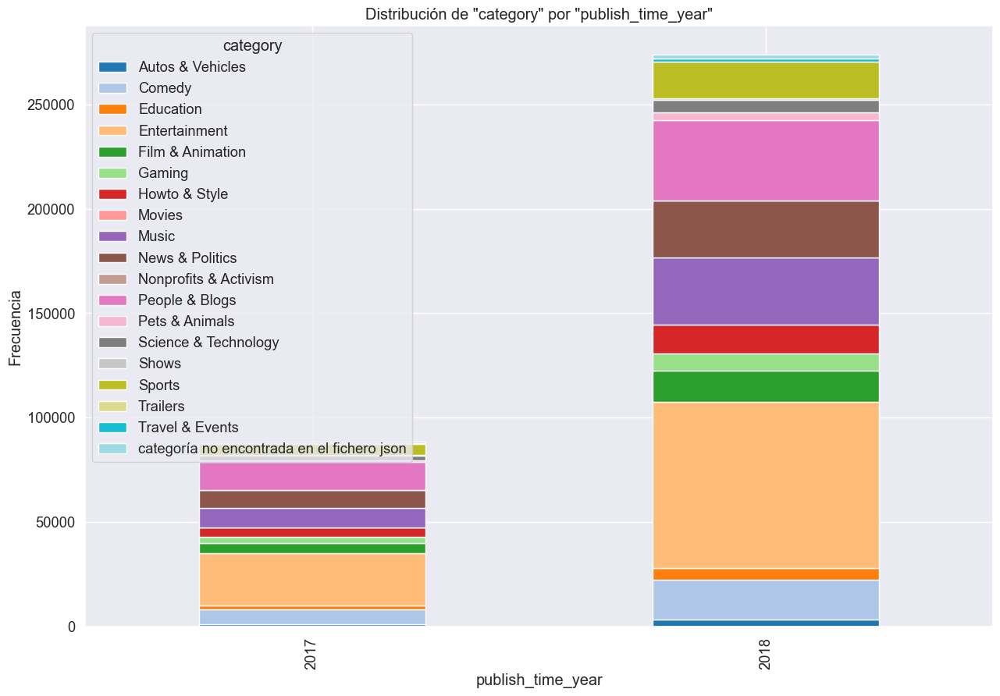

In [27]:
# gráfico de barras apiladas
col = 'publish_time_year'
cross_table.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('Frecuencia')
plt.show()

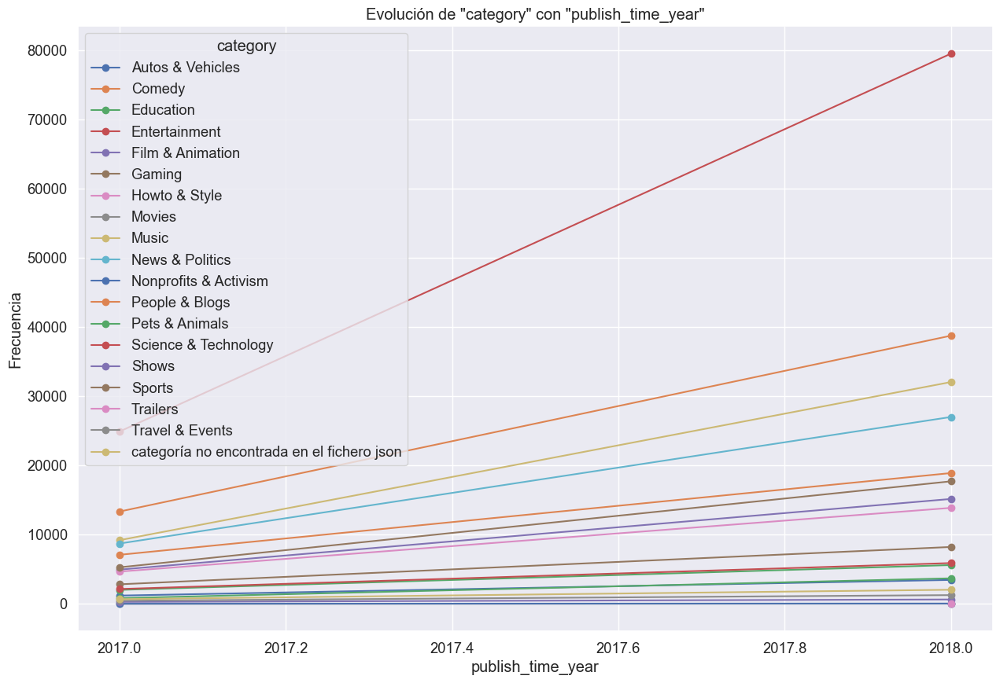

In [28]:
## gráfico de líneas por categoría
col = 'publish_time_year'
# creamos un dataframe agrupado por ambas variables
grouped = df.groupby([col, 'category']).size().unstack()
# graficamos el dataframe agrupado
grouped.plot(kind='line', figsize=(15, 10), marker='o')
plt.title('Evolución de "category" con "' + col + '"')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

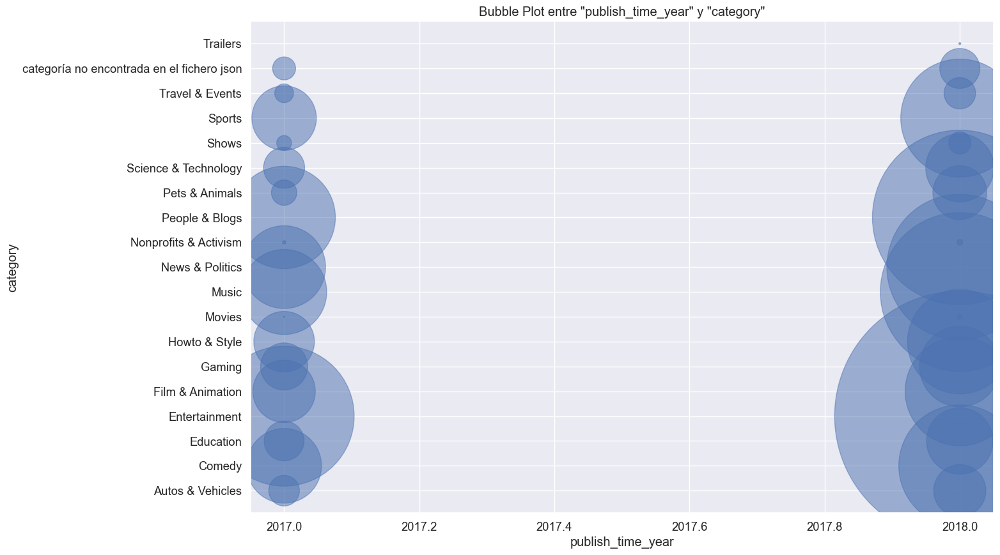

In [29]:
## gráfico de burbujas
col = 'publish_time_year'
# creamos una tabla de frecuencias
freq_table = df.groupby([col, 'category']).size().reset_index(name='counts')
# graficamos la tabla
plt.figure(figsize=(15, 10))
plt.scatter(freq_table[col], freq_table['category'], s=freq_table['counts'], alpha=0.5)
plt.title('Bubble Plot entre "' + col + '" y "category"')
plt.xlabel(col)
plt.ylabel('category')
plt.show()

<b>publish_time_month</b><br>
Aunque al contrario que en trending_date aquí sí tenemos datos entre Julio y Octubre, los valores de todas las categorías en estos meses son enormemente bajos, y en Junio y Noviembre son también más bajos que en el resto de meses, por lo que es posible que, aunque haya datos de esos meses en publish_time, sean incompletos.<br>
En cuanto a patrones mensuales, como en el caso de trending_date no se aprecian, aunque como allí se repite en publish_time los valores elevados de Diciembre, Marzo y Mayo.<br>
Entertainment es también la categoría con mayor número e incremento de publicaciones.

In [30]:
## mapa de calor
col = 'publish_time_month'
# creamos una tabla cruzada con la variable objetivo
cross_table = pd.crosstab(df[col], df['category'])
cross_table

category,Autos & Vehicles,Comedy,Education,Entertainment,Film & Animation,Gaming,Howto & Style,Movies,Music,News & Politics,Nonprofits & Activism,People & Blogs,Pets & Animals,Science & Technology,Shows,Sports,Trailers,Travel & Events,categoría no encontrada en el fichero json
publish_time_month,,,,,,,,,,,,,,,,,,,
1,584,3411,1170,13786,2653,1779,2610,1,5529,5449,21,7520,654,976,95,3259,0,242,388
2,790,3491,1159,14393,3110,1340,2903,0,5614,4689,13,7593,668,1391,76,3512,2,307,384
3,747,3647,1216,16241,2880,2024,2944,0,6733,5251,0,8332,739,1182,88,3461,1,263,477
4,523,3041,813,12367,2486,990,2114,5,5807,4587,0,6641,609,859,82,2780,0,198,347
5,578,4013,919,16675,2994,1397,2414,21,6856,5129,9,6426,765,1195,231,3259,2,174,323
6,233,1294,325,6046,1033,689,882,1,1510,1897,0,2237,252,289,58,1432,0,75,116
7,0,0,0,0,0,1,0,0,3,1,0,2,0,0,0,0,0,1,0
8,1,6,0,0,0,0,2,0,1,1,0,8,0,7,0,0,0,0,0
9,0,15,8,6,0,2,2,0,8,0,0,4,0,1,0,8,0,1,0


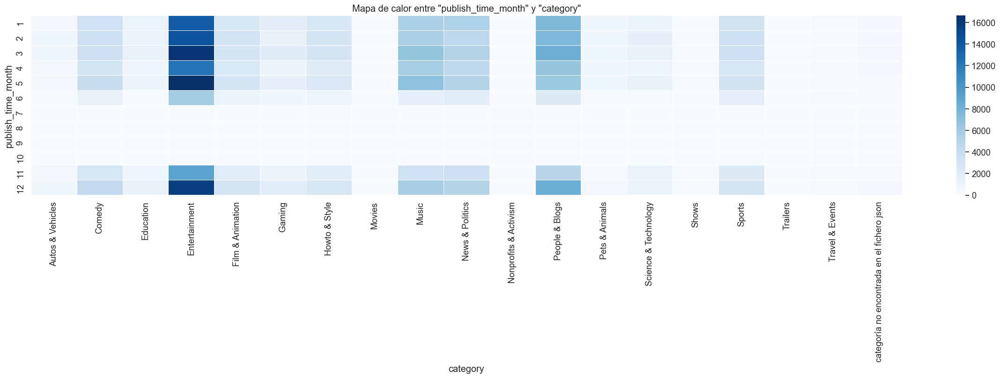

In [31]:
# graficamos el mapa de calor
plt.figure(figsize=(30, 5))
sns.heatmap(cross_table, cmap='Blues', linewidths=.5)
plt.title('Mapa de calor entre "' + col + '" y "category"')
plt.show()

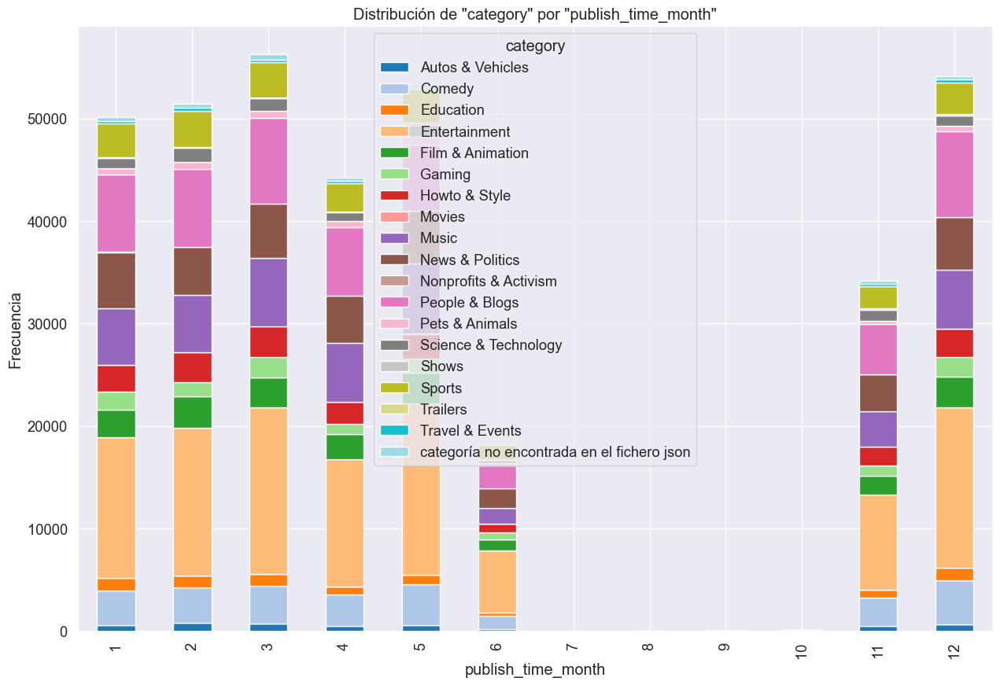

In [32]:
# gráfico de barras apiladas
col = 'publish_time_month'
cross_table.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('Frecuencia')
plt.show()

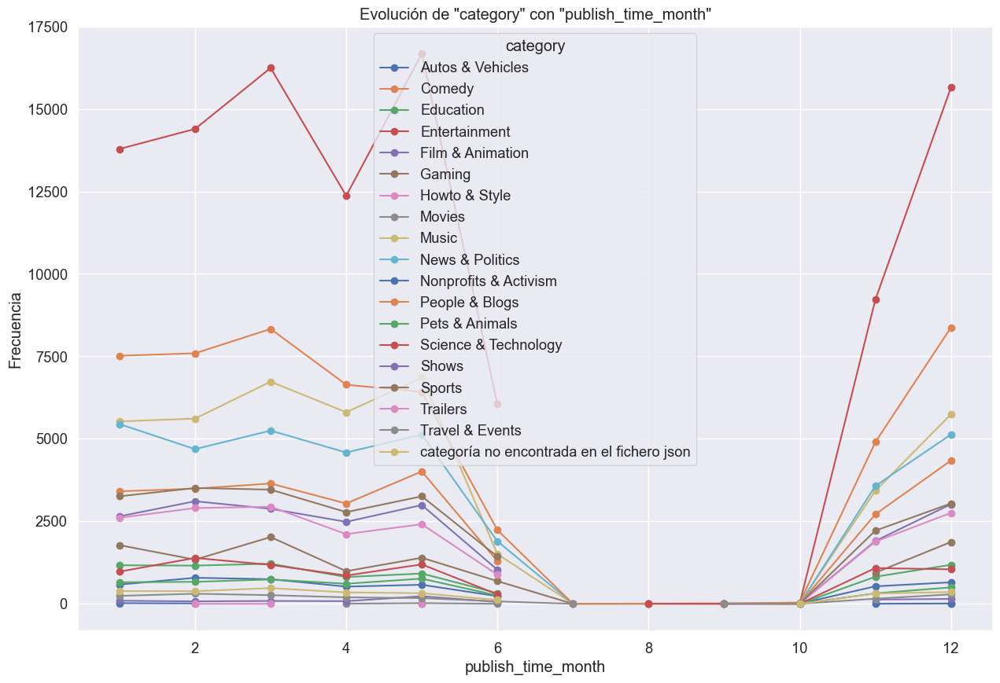

In [33]:
## gráfico de líneas por categoría
col = 'publish_time_month'
# creamos un dataframe agrupado por ambas variables
grouped = df.groupby([col, 'category']).size().unstack()
# graficamos el dataframe agrupado
grouped.plot(kind='line', figsize=(15, 10), marker='o')
plt.title('Evolución de "category" con "' + col + '"')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

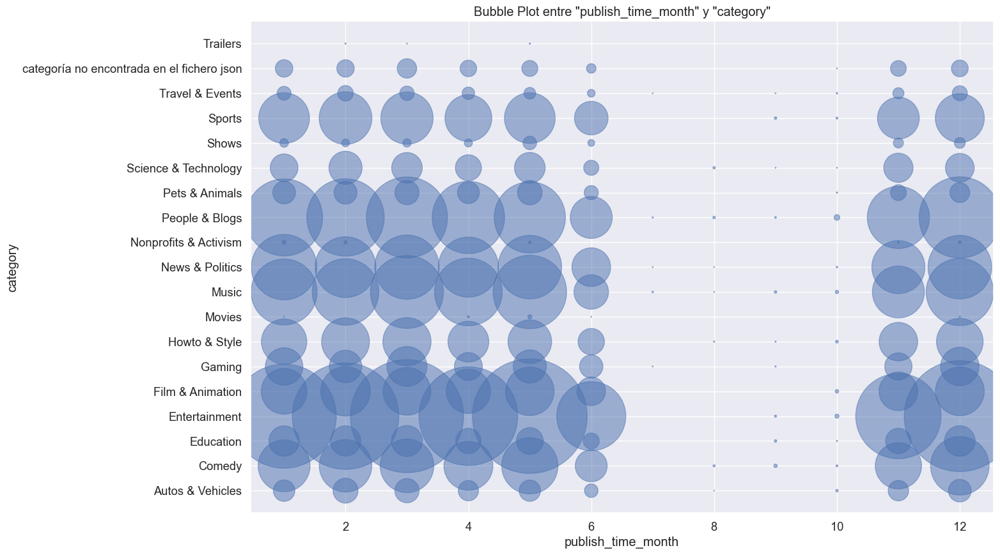

In [34]:
## gráfico de burbujas
col = 'publish_time_month'
# creamos una tabla de frecuencias
freq_table = df.groupby([col, 'category']).size().reset_index(name='counts')
# graficamos la tabla
plt.figure(figsize=(15, 10))
plt.scatter(freq_table[col], freq_table['category'], s=freq_table['counts'], alpha=0.5)
plt.title('Bubble Plot entre "' + col + '" y "category"')
plt.xlabel(col)
plt.ylabel('category')
plt.show()

<b>publish_trending_days</b><br>
La mayoría de categorías tienen un plazo de tiempo entre su publicación y su tendencia de entre 1 y 3 días. Sólo están por encima Nonprofits & Activism, Trailers y Music, con plazos entre 4 y 6 días.

C:\Users\Enrique\AppData\Local\Temp\ipykernel_5332\170948401.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=90)


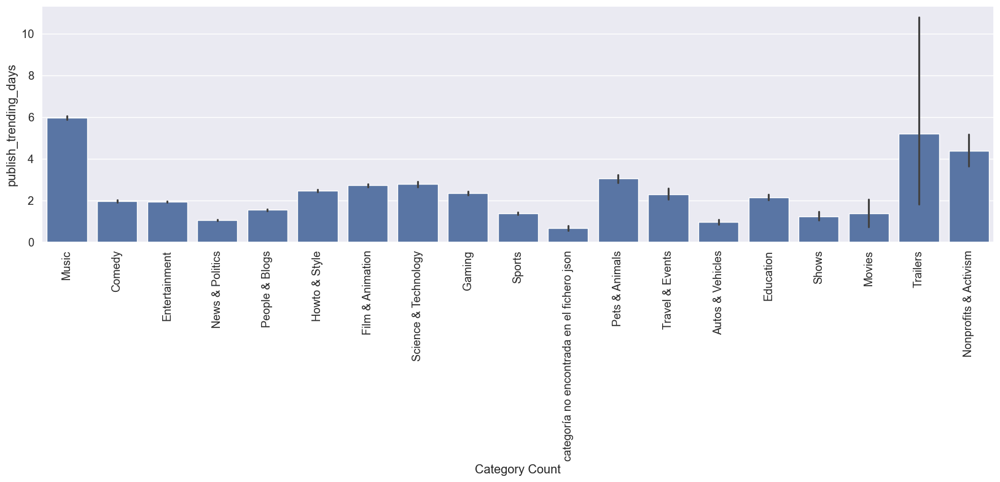

In [35]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

col = 'publish_trending_days'
g = sns.barplot(x='category', y=f"{col}", data=df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.xlabel('Category Count')
plt.ylabel(f'{col}')
plt.show()

## Variables categóricas y variable objetivo

<b>comments_disabled</b>

Sólo hay una categoría, Movies, con los comentarios desactivados en sus publicaciones, y hay otra categoría, Trailers, que es con diferencia la que más comentarios tiene activados, muy por encima del resto.<br>
Las categorías con pocos comentarios activados son Comedy y Music.

In [36]:
col = 'comments_disabled'

In [37]:
df.groupby('category')[col].mean()

category
Autos & Vehicles                              0.014845
Comedy                                        0.005889
Education                                     0.041623
Entertainment                                 0.022672
Film & Animation                              0.024332
Gaming                                        0.016846
Howto & Style                                 0.008314
Movies                                        0.000000
Music                                         0.005382
News & Politics                               0.051127
Nonprofits & Activism                         0.070175
People & Blogs                                0.019987
Pets & Animals                                0.015757
Science & Technology                          0.027515
Shows                                         0.020902
Sports                                        0.020411
Trailers                                      0.600000
Travel & Events                               0.009373
c

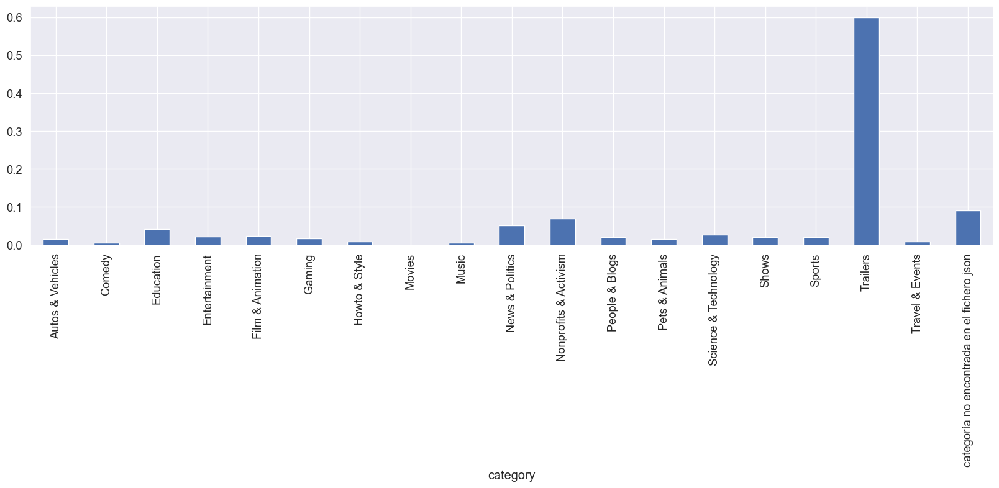

In [38]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

df.groupby('category')[col].mean().plot.bar()
plt.show()

<b>ratings_disabled</b>

Hay dos categorías con los ratings desactivados: Movies y Trailers.<br>
La categoría con más publicaciones con los ratings activados es Nonprofits & Activism, seguida a bastante distancia por News & Politics.

In [39]:
col = 'ratings_disabled'

In [40]:
df.groupby('category')[col].mean()

category
Autos & Vehicles                              0.016136
Comedy                                        0.009545
Education                                     0.023372
Entertainment                                 0.016034
Film & Animation                              0.023387
Gaming                                        0.010506
Howto & Style                                 0.007775
Movies                                        0.000000
Music                                         0.005285
News & Politics                               0.040571
Nonprofits & Activism                         0.070175
People & Blogs                                0.025536
Pets & Animals                                0.015091
Science & Technology                          0.011081
Shows                                         0.001100
Sports                                        0.017495
Trailers                                      0.000000
Travel & Events                               0.004687
c

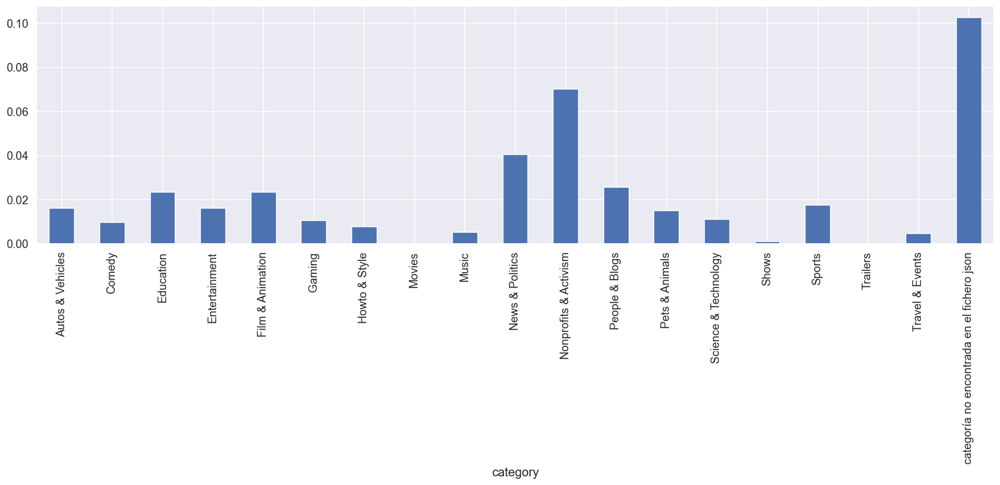

In [41]:
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

df.groupby('category')[col].mean().plot.bar()
plt.show()

<b>country</b>

Categorías como Entertainment, People & Blogs y News & Politics en general son las más comunes en casi todos los países.<br>
Por otra parte, Trailers, Nonprofits & Activism y Movies son las que menos aparecen.<br>
Japón parece ser el país que más diferencias presenta con respecto al resto de países.

In [42]:
## mapa de calor
col = 'country'
# creamos una tabla cruzada con la variable objetivo
cross_table = pd.crosstab(df[col], df['category'])
cross_table

category,Autos & Vehicles,Comedy,Education,Entertainment,Film & Animation,Gaming,Howto & Style,Movies,Music,News & Politics,Nonprofits & Activism,People & Blogs,Pets & Animals,Science & Technology,Shows,Sports,Trailers,Travel & Events,categoría no encontrada en el fichero json
country,,,,,,,,,,,,,,,,,,,
CA,351,3766,988,13444,2050,1343,2007,6,3726,4157,0,4096,369,1152,124,2786,0,392,72
DE,872,2534,844,15290,2375,1565,1745,2,2369,2932,0,5985,251,805,107,2751,1,141,256
FR,673,4337,767,9816,2155,1457,2357,11,3935,3748,0,5708,237,801,99,4340,2,118,114
GB,131,1750,428,8974,2540,1769,1917,0,13548,1218,0,2805,520,508,20,1873,0,86,90
IN,69,2967,1166,14762,1463,55,801,10,3292,4709,0,2367,3,517,149,646,0,8,103
JP,230,501,90,4454,867,721,577,0,962,1030,0,2831,838,110,0,1524,0,95,13
KR,118,1891,463,8379,2023,1289,526,0,1728,6954,0,6658,684,104,157,893,2,92,269
MX,252,1737,530,13471,1297,993,2464,0,3351,3101,0,8145,83,530,3,4046,0,117,252
RU,1581,3053,711,5925,3036,1039,1995,1,1885,5396,0,10307,603,1128,193,1967,0,257,1538


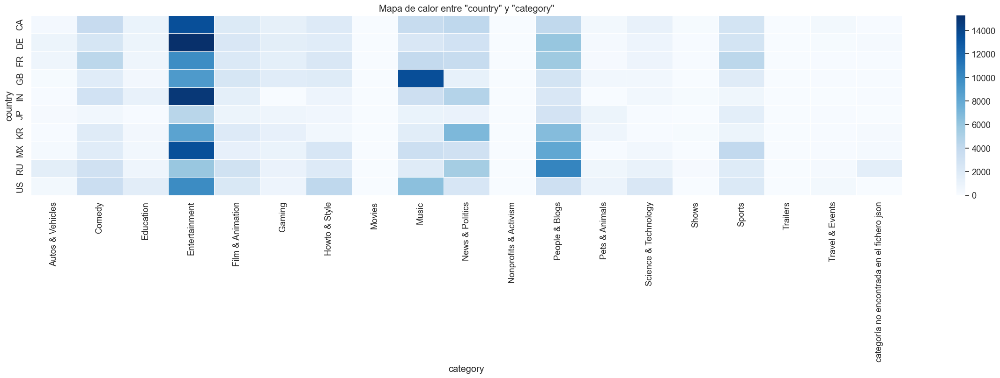

In [43]:
# graficamos el mapa de calor
plt.figure(figsize=(30, 5))
sns.heatmap(cross_table, cmap='Blues', linewidths=.5)
plt.title('Mapa de calor entre "' + col + '" y "category"')
plt.show()

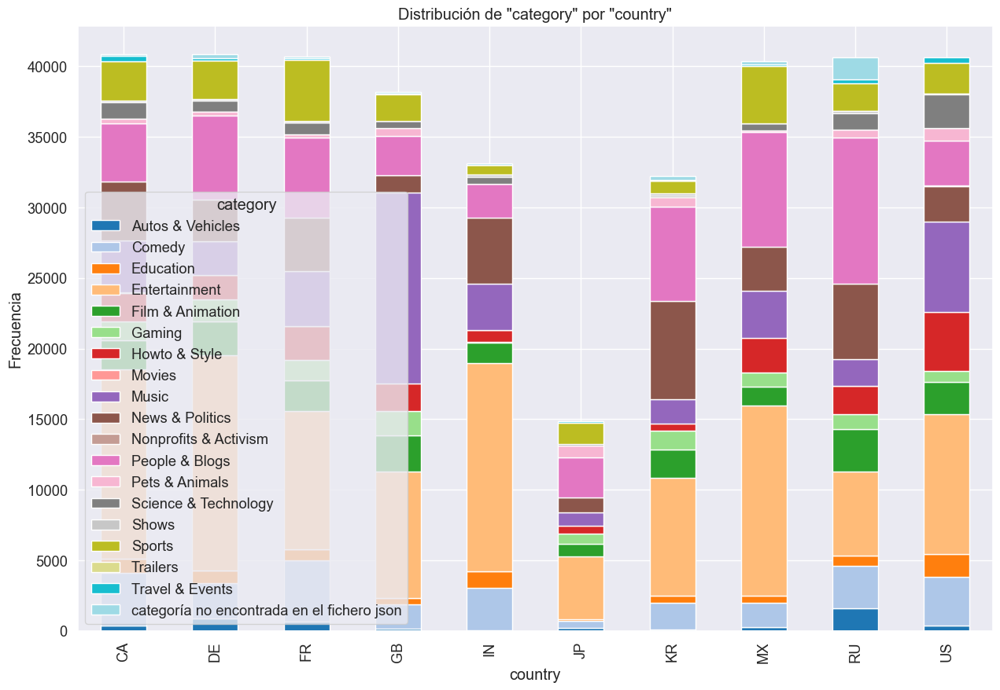

In [44]:
# gráfico de barras apiladas
col = 'country'
cross_table.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('Frecuencia')
plt.show()

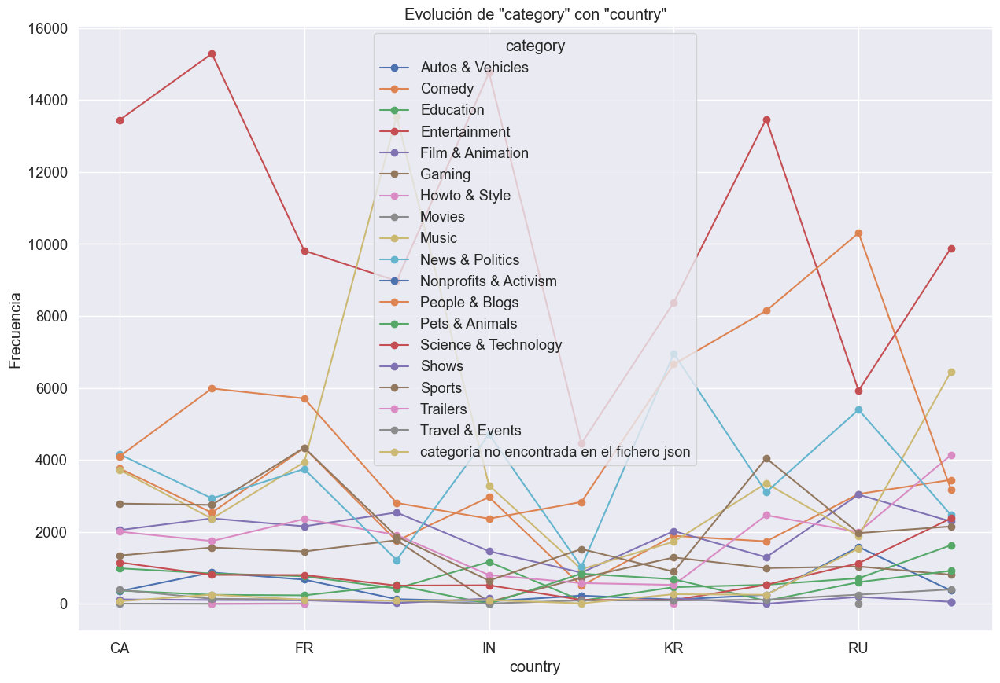

In [45]:
## gráfico de líneas por categoría
col = 'country'
# creamos un dataframe agrupado por ambas variables
grouped = df.groupby([col, 'category']).size().unstack()
# graficamos el dataframe agrupado
grouped.plot(kind='line', figsize=(15, 10), marker='o')
plt.title('Evolución de "category" con "' + col + '"')
plt.xlabel(col)
plt.ylabel('Frecuencia')
plt.show()

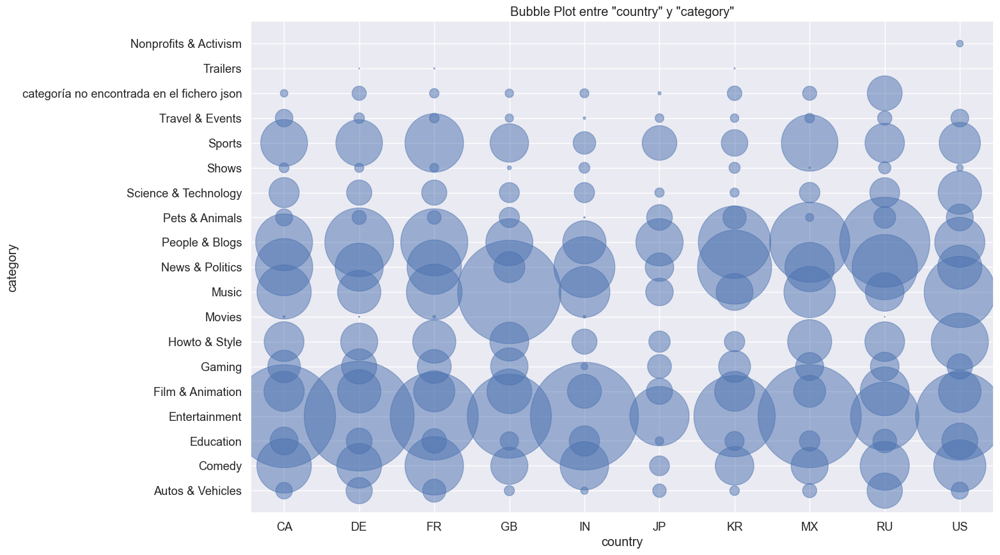

In [46]:
## gráfico de burbujas
col = 'country'
# creamos una tabla de frecuencias
freq_table = df.groupby([col, 'category']).size().reset_index(name='counts')
# graficamos la tabla
plt.figure(figsize=(15, 10))
plt.scatter(freq_table[col], freq_table['category'], s=freq_table['counts'], alpha=0.5)
plt.title('Bubble Plot entre "' + col + '" y "category"')
plt.xlabel(col)
plt.ylabel('category')
plt.show()

<b>channel_title</b>

Dado que channel_title tiene casi un 52% de valores únicos, vamos a graficar sólo los valores con mayor número de apariciones.

Entertainment es la categoría que más aparece en casi todos los canales. Otras categorías que también aparecen frecuentemente son Comedy y Sports.<br>
Hay categorías que apenas aparecen, como Autos & Vehicles, Education, Music y Pets & Animals.

In [47]:
col = 'channel_title'
# apariciones de cada valor de channel_title
channel_counts = df[col].value_counts()
# N valores de channel_title más comunes
N = 20
top_channels = channel_counts.head(N)
# filtro del dataframe de los N channel_title más comunes
df_top_channels = df[df[col].isin(top_channels.index)]

In [48]:
## mapa de calor
# creamos una tabla cruzada con la variable objetivo
cross_table = pd.crosstab(df_top_channels[col], df_top_channels['category'])
cross_table

category,Autos & Vehicles,Comedy,Education,Entertainment,Film & Animation,Gaming,Music,News & Politics,People & Blogs,Pets & Animals,Shows,Sports,categoría no encontrada en el fichero json
channel_title,,,,,,,,,,,,,
BuzzFeedVideo,0,0,0,1,0,0,0,0,475,0,0,0,0
CNN,0,0,0,0,0,0,0,576,0,0,0,0,2
ESPN,0,0,0,0,0,0,0,0,0,0,0,485,0
FBE,0,0,0,554,0,0,0,0,0,0,0,0,0
Jimmy Kimmel Live,0,301,0,390,0,0,6,0,0,0,0,0,0
Late Night with Seth Meyers,0,770,0,0,0,0,0,0,0,0,0,0,0
MLG Highlights,0,0,0,0,0,0,0,0,0,0,0,532,0
Marvel Entertainment,23,0,0,439,0,0,0,0,0,0,0,0,0
Netflix,0,0,0,549,0,0,0,0,0,0,0,0,0


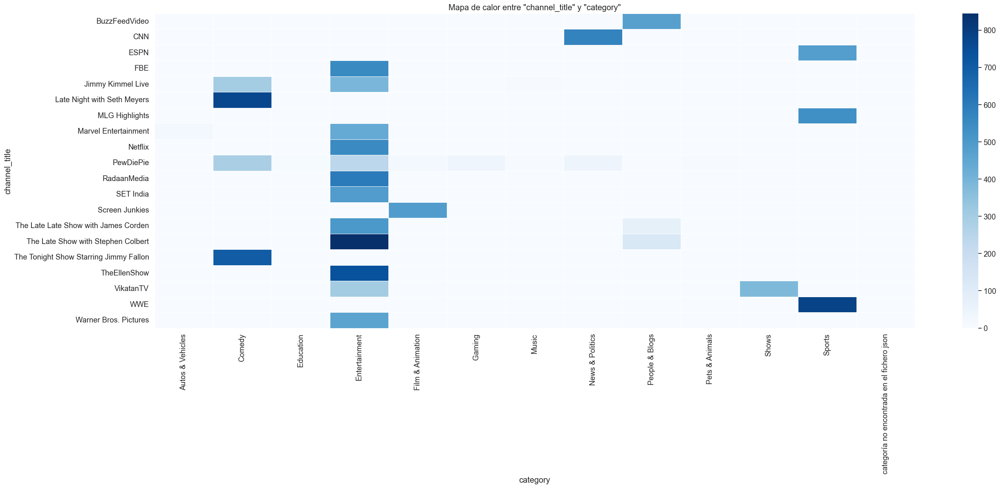

In [49]:
# graficamos el mapa de calor
plt.figure(figsize=(30, 10))
sns.heatmap(cross_table, cmap='Blues', linewidths=.5)
plt.title('Mapa de calor entre "' + col + '" y "category"')
plt.show()

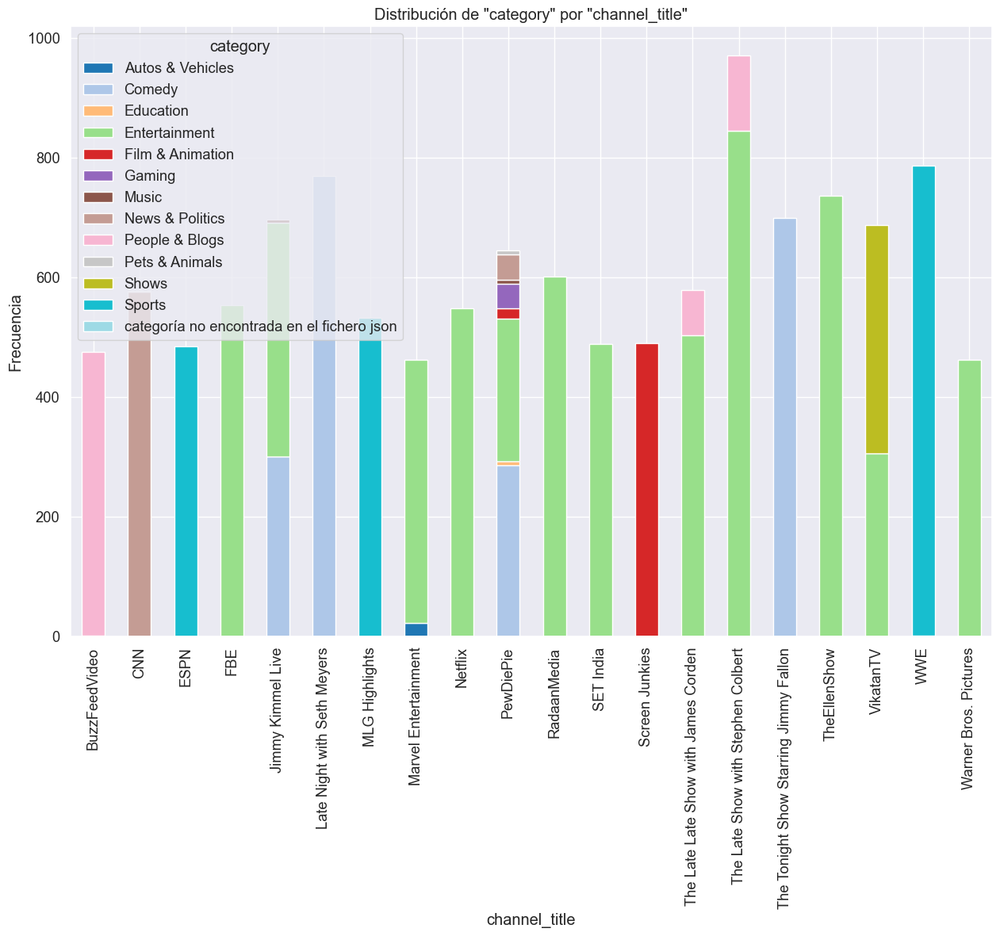

In [50]:
# gráfico de barras apiladas
col = 'channel_title'
cross_table.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('Frecuencia')
plt.show()

<b>tags</b>

La variable tags está compuesta de diferentes valores individuales separados por el carácter '|'. Para poder trabajar con ella, vamos a separar esos valores individuales.

In [51]:
df_tags = df.copy()
# convertimos tags en listas de valores individuales
df_tags['tags_separados'] = df_tags['tags'].apply(lambda x: x.split('|'))
# creamos nuevos registros para tener un valor individual en cada registro
df_tags = df_tags.explode('tags_separados', ignore_index=True)
df_tags[['tags', 'tags_separados']]

,tags,tags_separados
0,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",Eminem
1,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...","""Walk"""
2,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...","""On"""
3,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...","""Water"""
4,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...","""Aftermath/Shady/Interscope"""
...,...,...
6272713,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...","""ending explained"""
6272714,"call of duty|""cod""|""activision""|""Black Ops 4""",call of duty
6272715,"call of duty|""cod""|""activision""|""Black Ops 4""","""cod"""
6272716,"call of duty|""cod""|""activision""|""Black Ops 4""","""activision"""


In [52]:
df_tags[['tags_separados']].value_counts()

tags_separados                                               
[none]                                                           36043
"funny"                                                          14478
"comedy"                                                         11607
"2018"                                                           10890
"news"                                                            5872
                                                                 ...  
"merry happy"                                                        1
"merry cristmas"                                                     1
"5 videos choquantes"                                                1
"merry christmas songs collection"                                   1
ﻛﻴﻒ ﺗﻘﻮﻝ ﺑﺎﻷﻟﻤﺎﻧﻲ صحيح نحن لاجئين لكن عنا كرامة وأخلاق وعواطف        1
Name: count, Length: 902607, dtype: int64

El principal valor individual de tags es '[none]', aparece más del doble de veces que el segundo valor más frecuente.<br>
Vamos a estudiar la relación de tags con la variable objetivo teniendo esto en cuenta.

In [53]:
col = 'tags_separados'
# apariciones de cada valor de tags
tags_counts = df_tags[col].value_counts()
# N valores de tags más comunes
N = 20
top_tags = tags_counts.head(N)
# filtro del dataframe de los N tags más comunes
df_top_tags = df_tags[df_tags[col].isin(top_tags.index)]

# eliminamos el valor [none] de top_tags
top_tags = top_tags[top_tags.index != '[none]']
# filtro del dataframe de los N tags más comunes sin [none]
df_top_tags_sin_none = df_tags[df_tags[col].isin(top_tags.index)]

In [54]:
## mapa de calor
# creamos una tabla cruzada con la variable objetivo
cross_table = pd.crosstab(df_top_tags[col], df_top_tags['category'])
cross_table_sin_none = pd.crosstab(df_top_tags_sin_none[col], df_top_tags['category'])
cross_table

category,Autos & Vehicles,Comedy,Education,Entertainment,Film & Animation,Gaming,Howto & Style,Movies,Music,News & Politics,Nonprofits & Activism,People & Blogs,Pets & Animals,Science & Technology,Shows,Sports,Trailers,Travel & Events,categoría no encontrada en el fichero json
tags_separados,,,,,,,,,,,,,,,,,,,
"""2017""",108,430,95,1449,339,185,219,0,636,297,0,582,19,216,0,788,0,65,41
"""2018""",127,759,206,3045,1118,205,484,0,1202,809,0,1123,20,258,8,1393,0,32,101
"""Pop""",0,8,0,29,18,0,0,0,3806,0,0,6,0,0,0,0,0,0,0
"""comedian""",0,894,0,2142,52,0,16,0,6,43,0,392,0,0,3,5,0,0,0
"""comedy""",2,4641,17,4716,409,110,269,17,142,132,0,1033,4,18,39,56,0,0,2
"""food""",0,428,102,671,3,6,1454,0,9,15,0,569,31,24,0,22,0,226,0
"""funny videos""",0,874,5,2166,7,6,8,0,3,2,0,259,32,0,0,28,0,0,0
"""funny""",21,4632,178,5932,303,500,702,17,144,103,0,1289,367,93,2,187,0,7,1
"""humor""",0,2536,8,1821,110,84,60,0,68,34,0,271,0,4,0,9,0,0,0


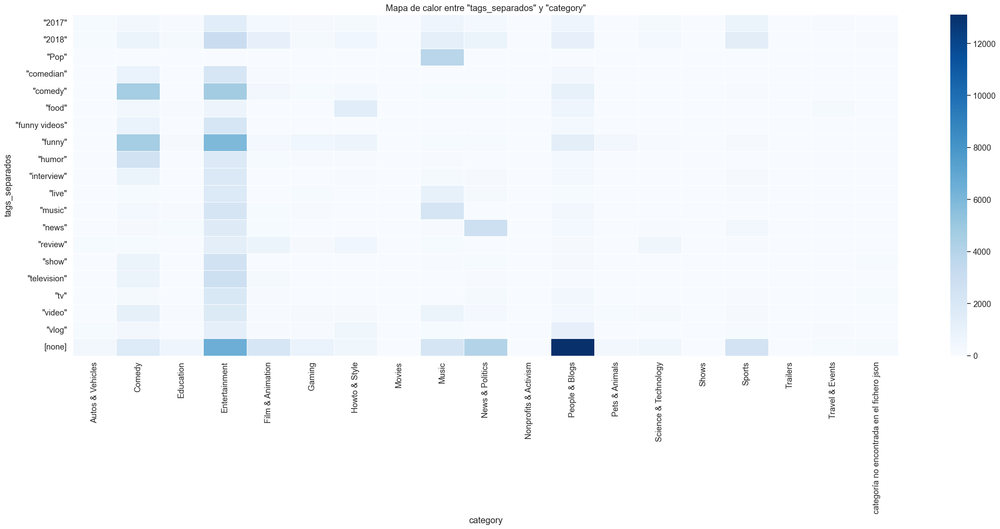

In [55]:
# graficamos el mapa de calor
plt.figure(figsize=(30, 10))
sns.heatmap(cross_table, cmap='Blues', linewidths=.5)
plt.title('Mapa de calor entre "' + col + '" y "category"')
plt.show()

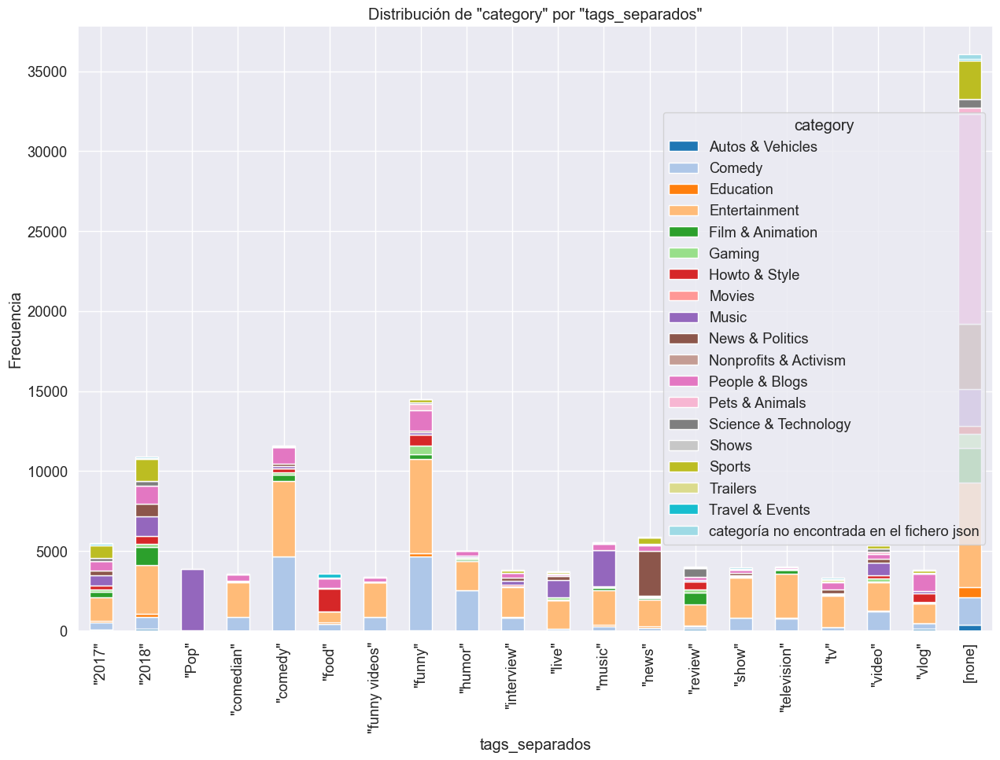

In [56]:
# gráfico de barras apiladas
col = 'tags_separados'
cross_table.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('Frecuencia')
plt.show()

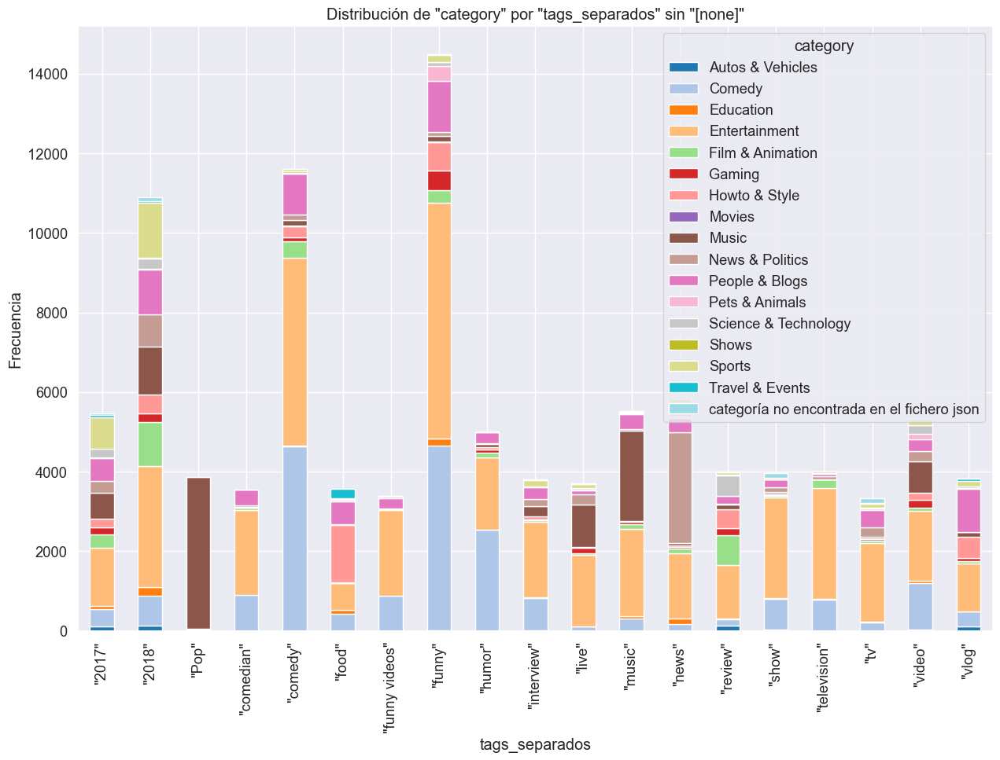

In [57]:
# gráfico de barras apiladas sin [none]
col = 'tags_separados'
cross_table_sin_none.plot(kind='bar', stacked=True, figsize=(15, 10), colormap='tab20')
plt.title('Distribución de "category" por "' + col + '" sin "[none]"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('Frecuencia')
plt.show()

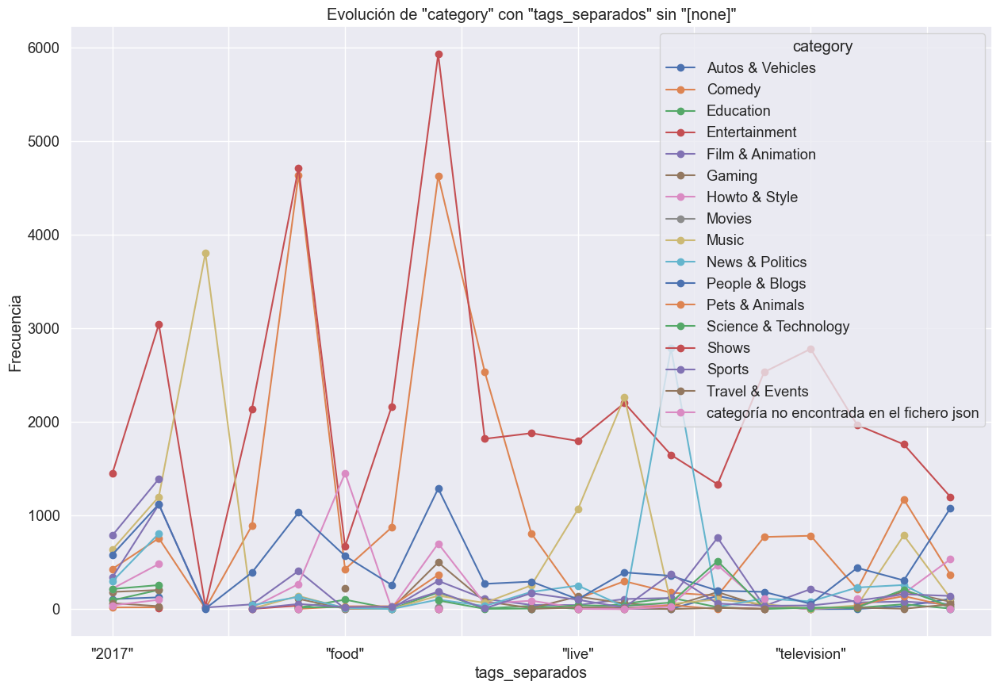

In [58]:
## gráfico de líneas por categoría sin [none]
col = 'tags_separados'
# creamos un dataframe agrupado por ambas variables
grouped = df_top_tags_sin_none.groupby([col, 'category']).size().unstack()
# graficamos el dataframe agrupado
grouped.plot(kind='line', figsize=(15, 10), marker='o')
plt.title('Evolución de "category" con "' + col + '" sin "[none]"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('Frecuencia')
plt.show()

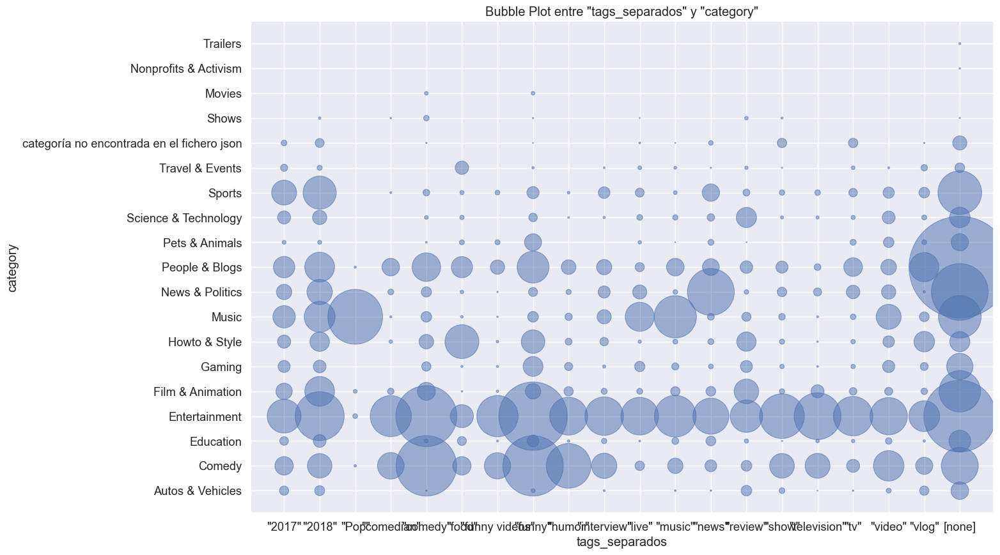

In [59]:
## gráfico de burbujas
col = 'tags_separados'
# creamos una tabla de frecuencias
freq_table = df_top_tags.groupby([col, 'category']).size().reset_index(name='counts')
# graficamos la tabla
plt.figure(figsize=(15, 10))
plt.scatter(freq_table[col], freq_table['category'], s=freq_table['counts'], alpha=0.5)
plt.title('Bubble Plot entre "' + col + '" y "category"')
plt.xlabel(col)
#plt.xticks([])
plt.ylabel('category')
plt.show()

El tag a '[none]' se concentra en las categorías People & Blogs y Entertainment.<br>
La siguiente categoría más frecuente es Entertainment, que tiene representados casi todos los tags más comunes.<br>
Hay categorías prácticamente sin tags, como Trailers y Nonprofits & Activism.

Codificamos la variable tags_separados, usando Label Encoder.

In [60]:
le = LabelEncoder()

In [61]:
tags_model = le.fit(df_tags['tags_separados'])
df_tags['tags_separados_encoded'] = tags_model.transform(df_tags['tags_separados'])
df_tags[['tags_separados', 'tags_separados_encoded']]

,tags_separados,tags_separados_encoded
0,Eminem,848500
1,"""Walk""",213305
2,"""On""",150933
3,"""Water""",213916
4,"""Aftermath/Shady/Interscope""",26090
...,...,...
6272713,"""ending explained""",322619
6272714,call of duty,867883
6272715,"""cod""",283597
6272716,"""activision""",223424


# Preprocesamiento de datos

Preparamos el dataset para aplicar algoritmos de Machine Learning.<br>

Vamos a preparar dos versiones del dataset:

- df: variable 'tags' original
- df_tags: variable 'tags_separados', con un registro para cada tag individual

El motivo de esta división es que df tiene unos 350.000 registros, y df_tags más de 6 millones, por lo que es mucho más costoso su estudio computacionalmente hablando.

In [62]:
df.columns

Index(['channel_title', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'comments_disabled', 'ratings_disabled', 'category', 'country',
       'trending_date_year', 'trending_date_month', 'publish_time_year',
       'publish_time_month', 'ratio_viralidad', 'ratio_interaccion_dia',
       'publish_trending_days', 'channel_title_encoded', 'tags_encoded',
       'category_encoded', 'country_encoded', 'views_encoded', 'likes_encoded',
       'dislikes_encoded', 'comment_count_encoded',
       'ratio_interaccion_dia_encoded', 'trending_date_year_encoded',
       'trending_date_month_encoded', 'publish_time_year_encoded',
       'publish_time_month_encoded'],
      dtype='object')

In [63]:
df_tags.columns

Index(['channel_title', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'comments_disabled', 'ratings_disabled', 'category', 'country',
       'trending_date_year', 'trending_date_month', 'publish_time_year',
       'publish_time_month', 'ratio_viralidad', 'ratio_interaccion_dia',
       'publish_trending_days', 'channel_title_encoded', 'tags_encoded',
       'category_encoded', 'country_encoded', 'views_encoded', 'likes_encoded',
       'dislikes_encoded', 'comment_count_encoded',
       'ratio_interaccion_dia_encoded', 'trending_date_year_encoded',
       'trending_date_month_encoded', 'publish_time_year_encoded',
       'publish_time_month_encoded', 'tags_separados',
       'tags_separados_encoded'],
      dtype='object')

Vamos a estudiar dos grupos de variables de entrada y dos de salida:<br>
- X: entrada a partir del dataframe con una única variable tags
- X_tags: entrada a partir del dataframe con una variable para los tags separados
- y: salida a partir del dataframe con una única variable tags
- y_tags: salida a partir del dataframe con una variable para los tags separados

In [64]:
X = df[['channel_title_encoded', 'tags_encoded', 'views_encoded', 'likes_encoded', 'dislikes_encoded', 'comment_count_encoded', 'comments_disabled',\
        'ratings_disabled', 'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded', 'trending_date_year_encoded',\
        'trending_date_month_encoded', 'publish_time_year_encoded', 'publish_time_month_encoded', 'publish_trending_days']]
X

,channel_title_encoded,tags_encoded,views_encoded,likes_encoded,dislikes_encoded,comment_count_encoded,comments_disabled,ratings_disabled,country_encoded,ratio_viralidad,ratio_interaccion_dia_encoded,trending_date_year_encoded,trending_date_month_encoded,publish_time_year_encoded,publish_time_month_encoded,publish_trending_days
0,7408,15414,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,-1.823782,0.909091,-1.758901,0.909091,3
1,28209,87447,-0.046118,0.536588,-0.020748,0.342217,False,False,0,0.140454,0.455009,-1.823782,0.909091,-1.758901,0.909091,0
2,20687,88781,0.256091,0.646234,0.138859,0.151795,False,False,0,0.049995,0.536320,-1.823782,0.909091,-1.758901,0.909091,1
3,29088,91178,0.103985,0.563307,-0.007590,0.518462,False,False,0,0.072404,0.499064,-1.823782,0.909091,-1.758901,0.909091,1
4,7030,64232,4.467192,9.591119,0.827083,3.171140,False,False,0,0.051912,8.064620,-1.823782,0.909091,-1.758901,0.909091,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375937,910,51299,0.047033,-0.002199,-0.033994,-0.065135,False,False,9,0.025037,-0.007461,0.548311,0.454545,0.568537,0.363636,26
375938,30196,51138,-0.039156,0.129129,-0.077842,-0.014908,False,False,9,0.060411,0.106531,0.548311,0.454545,0.568537,0.363636,26
375939,3535,21958,-0.038926,0.057358,-0.049426,-0.012709,False,False,9,0.049784,0.048649,0.548311,0.454545,0.568537,0.363636,26
375940,10426,8106,0.598922,0.928280,0.029875,0.344494,False,False,9,0.036901,0.850929,0.548311,0.454545,0.568537,0.363636,27


In [65]:
X_tags = df_tags[['channel_title_encoded', 'views_encoded', 'likes_encoded', 'dislikes_encoded', 'comment_count_encoded', 'comments_disabled', 'ratings_disabled',\
                  'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded', 'tags_separados_encoded', 'trending_date_year_encoded', 'trending_date_month_encoded',\
                  'publish_time_year_encoded', 'publish_time_month_encoded', 'publish_trending_days']]
X_tags

,channel_title_encoded,views_encoded,likes_encoded,dislikes_encoded,comment_count_encoded,comments_disabled,ratings_disabled,country_encoded,ratio_viralidad,ratio_interaccion_dia_encoded,tags_separados_encoded,trending_date_year_encoded,trending_date_month_encoded,publish_time_year_encoded,publish_time_month_encoded,publish_trending_days
0,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,848500,-1.823782,0.909091,-1.758901,0.909091,3
1,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,213305,-1.823782,0.909091,-1.758901,0.909091,3
2,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,150933,-1.823782,0.909091,-1.758901,0.909091,3
3,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,213916,-1.823782,0.909091,-1.758901,0.909091,3
4,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,26090,-1.823782,0.909091,-1.758901,0.909091,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6272713,10426,0.598922,0.928280,0.029875,0.344494,False,False,9,0.036901,0.850929,322619,0.548311,0.454545,0.568537,0.363636,27
6272714,4097,1.243842,1.914812,9.215949,5.516684,False,False,9,0.069362,3.456724,867883,0.548311,0.454545,0.568537,0.363636,27
6272715,4097,1.243842,1.914812,9.215949,5.516684,False,False,9,0.069362,3.456724,283597,0.548311,0.454545,0.568537,0.363636,27
6272716,4097,1.243842,1.914812,9.215949,5.516684,False,False,9,0.069362,3.456724,223424,0.548311,0.454545,0.568537,0.363636,27


In [66]:
y = df[['category_encoded']].copy(deep=True)
y

,category_encoded
0,8
1,1
2,1
3,3
4,8
...,...
375937,12
375938,11
375939,3
375940,4


In [67]:
y_tags = df_tags[['category_encoded']].copy(deep=True)
y_tags

,category_encoded
0,8
1,8
2,8
3,8
4,8
...,...
6272713,4
6272714,5
6272715,5
6272716,5


- <b>Mapa de correlaciones</b> de todas las variables implicadas

In [68]:
X_for_corr = X.copy()
X_for_corr['category'] = y

In [69]:
X_for_corr.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'comments_disabled', 'ratings_disabled', 'country_encoded',
       'ratio_viralidad', 'ratio_interaccion_dia_encoded',
       'trending_date_year_encoded', 'trending_date_month_encoded',
       'publish_time_year_encoded', 'publish_time_month_encoded',
       'publish_trending_days', 'category'],
      dtype='object')

In [70]:
X_for_corr.head()

,channel_title_encoded,tags_encoded,views_encoded,likes_encoded,dislikes_encoded,comment_count_encoded,comments_disabled,ratings_disabled,country_encoded,ratio_viralidad,ratio_interaccion_dia_encoded,trending_date_year_encoded,trending_date_month_encoded,publish_time_year_encoded,publish_time_month_encoded,publish_trending_days,category
0,7408,15414,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,-1.823782,0.909091,-1.758901,0.909091,3,8
1,28209,87447,-0.046118,0.536588,-0.020748,0.342217,False,False,0,0.140454,0.455009,-1.823782,0.909091,-1.758901,0.909091,0,1
2,20687,88781,0.256091,0.646234,0.138859,0.151795,False,False,0,0.049995,0.536320,-1.823782,0.909091,-1.758901,0.909091,1,1
3,29088,91178,0.103985,0.563307,-0.007590,0.518462,False,False,0,0.072404,0.499064,-1.823782,0.909091,-1.758901,0.909091,1,3
4,7030,64232,4.467192,9.591119,0.827083,3.171140,False,False,0,0.051912,8.064620,-1.823782,0.909091,-1.758901,0.909091,4,8


In [71]:
corr_matrix = X_for_corr.corr()

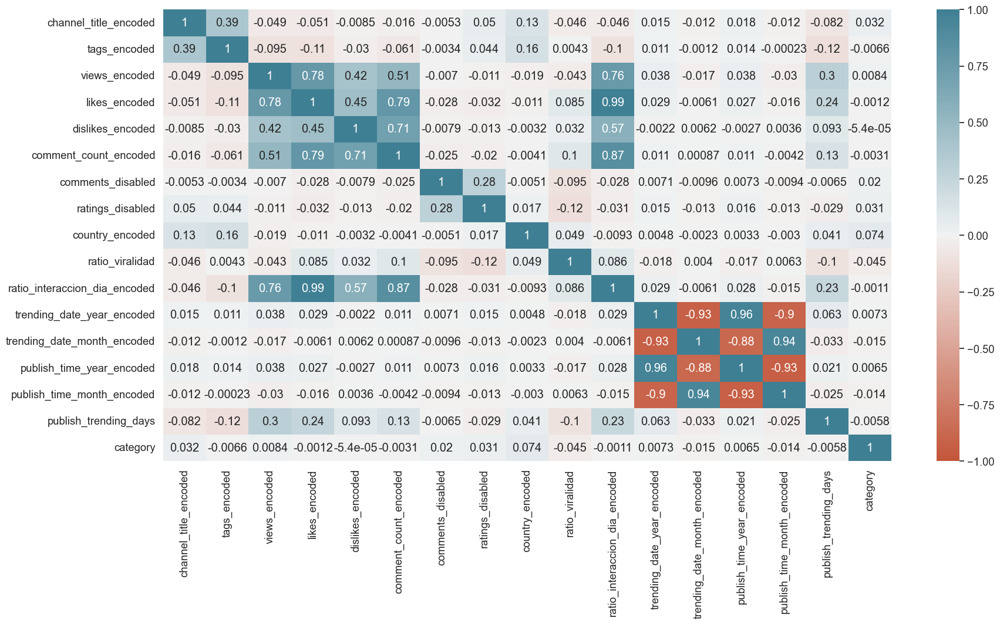

In [72]:
plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix, annot=True, cmap=sns.diverging_palette(20, 220, n=256), vmin=-1, vmax=1)
plt.show()

Esta matriz de correlación nos indica que no hay correlación lineal entre ninguna de las variables implicadas y 'category', la variable objetivo.

- <b>Entrenamiento y validación</b>

- dataset con variable tags

In [73]:
X.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'comments_disabled', 'ratings_disabled', 'country_encoded',
       'ratio_viralidad', 'ratio_interaccion_dia_encoded',
       'trending_date_year_encoded', 'trending_date_month_encoded',
       'publish_time_year_encoded', 'publish_time_month_encoded',
       'publish_trending_days'],
      dtype='object')

In [74]:
X

,channel_title_encoded,tags_encoded,views_encoded,likes_encoded,dislikes_encoded,comment_count_encoded,comments_disabled,ratings_disabled,country_encoded,ratio_viralidad,ratio_interaccion_dia_encoded,trending_date_year_encoded,trending_date_month_encoded,publish_time_year_encoded,publish_time_month_encoded,publish_trending_days
0,7408,15414,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,-1.823782,0.909091,-1.758901,0.909091,3
1,28209,87447,-0.046118,0.536588,-0.020748,0.342217,False,False,0,0.140454,0.455009,-1.823782,0.909091,-1.758901,0.909091,0
2,20687,88781,0.256091,0.646234,0.138859,0.151795,False,False,0,0.049995,0.536320,-1.823782,0.909091,-1.758901,0.909091,1
3,29088,91178,0.103985,0.563307,-0.007590,0.518462,False,False,0,0.072404,0.499064,-1.823782,0.909091,-1.758901,0.909091,1
4,7030,64232,4.467192,9.591119,0.827083,3.171140,False,False,0,0.051912,8.064620,-1.823782,0.909091,-1.758901,0.909091,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375937,910,51299,0.047033,-0.002199,-0.033994,-0.065135,False,False,9,0.025037,-0.007461,0.548311,0.454545,0.568537,0.363636,26
375938,30196,51138,-0.039156,0.129129,-0.077842,-0.014908,False,False,9,0.060411,0.106531,0.548311,0.454545,0.568537,0.363636,26
375939,3535,21958,-0.038926,0.057358,-0.049426,-0.012709,False,False,9,0.049784,0.048649,0.548311,0.454545,0.568537,0.363636,26
375940,10426,8106,0.598922,0.928280,0.029875,0.344494,False,False,9,0.036901,0.850929,0.548311,0.454545,0.568537,0.363636,27


In [75]:
y

,category_encoded
0,8
1,1
2,1
3,3
4,8
...,...
375937,12
375938,11
375939,3
375940,4


In [76]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

- dataset con variable tags_separados

In [77]:
X_tags.columns

Index(['channel_title_encoded', 'views_encoded', 'likes_encoded',
       'dislikes_encoded', 'comment_count_encoded', 'comments_disabled',
       'ratings_disabled', 'country_encoded', 'ratio_viralidad',
       'ratio_interaccion_dia_encoded', 'tags_separados_encoded',
       'trending_date_year_encoded', 'trending_date_month_encoded',
       'publish_time_year_encoded', 'publish_time_month_encoded',
       'publish_trending_days'],
      dtype='object')

In [78]:
X_tags

,channel_title_encoded,views_encoded,likes_encoded,dislikes_encoded,comment_count_encoded,comments_disabled,ratings_disabled,country_encoded,ratio_viralidad,ratio_interaccion_dia_encoded,tags_separados_encoded,trending_date_year_encoded,trending_date_month_encoded,publish_time_year_encoded,publish_time_month_encoded,publish_trending_days
0,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,848500,-1.823782,0.909091,-1.758901,0.909091,3
1,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,213305,-1.823782,0.909091,-1.758901,0.909091,3
2,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,150933,-1.823782,0.909091,-1.758901,0.909091,3
3,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,213916,-1.823782,0.909091,-1.758901,0.909091,3
4,7408,2.195188,4.501606,1.803614,4.773962,False,False,0,0.055758,4.334115,26090,-1.823782,0.909091,-1.758901,0.909091,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6272713,10426,0.598922,0.928280,0.029875,0.344494,False,False,9,0.036901,0.850929,322619,0.548311,0.454545,0.568537,0.363636,27
6272714,4097,1.243842,1.914812,9.215949,5.516684,False,False,9,0.069362,3.456724,867883,0.548311,0.454545,0.568537,0.363636,27
6272715,4097,1.243842,1.914812,9.215949,5.516684,False,False,9,0.069362,3.456724,283597,0.548311,0.454545,0.568537,0.363636,27
6272716,4097,1.243842,1.914812,9.215949,5.516684,False,False,9,0.069362,3.456724,223424,0.548311,0.454545,0.568537,0.363636,27


In [79]:
y_tags

,category_encoded
0,8
1,8
2,8
3,8
4,8
...,...
6272713,4
6272714,5
6272715,5
6272716,5


In [80]:
X_train_tags, X_test_tags, y_train_tags, y_test_tags = train_test_split(X_tags, y_tags, test_size=0.3, random_state=42)

- <b>Balancear la variable objetivo</b>

Como vimos, la variable objetivo está muy desbalanceada, por lo que los resultados de los algoritmos que apliquemos pueden estar sesgados hacia las clases mayoritarias.<br>
Algunos modelos pueden trabajar con variables desbalanceadas, indicándoselo en los parámetros, pero otros necesitarán recibir los datos ya balanceados.<br>
Vamos a balancear la variable objetivo en el conjunto de entrenamiento, y evaluaremos los modelos con el conjunto de prueba que no se va a modificar y refleja por tanto la distribución real de las clases.<br>
Para hacer el balanceo, vamos a normalizar la suma de los pesos de la muestra para cada clase al mismo valor.

- dataset con variable tags

In [81]:
y_train

,category_encoded
237478,11
85145,5
229682,9
160791,8
229452,11
...,...
119995,8
272332,6
132306,11
147551,4


In [82]:
y_train.value_counts()

category_encoded
3                   73216
11                  36424
8                   29011
9                   24886
1                   18093
15                  16142
4                   14038
6                   12994
5                    7760
13                   5634
2                    5310
0                    3284
12                   3049
18                   1861
17                   1193
14                    643
10                     35
7                      21
16                      4
Name: count, dtype: int64

In [83]:
# obtenemos el número de muestras por clase
class_distribution = Counter(y_train['category_encoded'])
class_distribution

Counter({3: 73216,
         11: 36424,
         8: 29011,
         9: 24886,
         1: 18093,
         15: 16142,
         4: 14038,
         6: 12994,
         5: 7760,
         13: 5634,
         2: 5310,
         0: 3284,
         12: 3049,
         18: 1861,
         17: 1193,
         14: 643,
         10: 35,
         7: 21,
         16: 4})

In [84]:
# número total de muestras
total_samples = sum(class_distribution.values())
# número de clases
num_classes = len(class_distribution)
# suma de pesos por clase
sum_per_class = total_samples / num_classes
# cálculo de los pesos de cada clase
class_weight = {}
for class_name, count in class_distribution.items():
    class_weight[class_name] = sum_per_class / count

print(class_weight)

{11: 0.36644144404499057, 5: 1.720008138903961, 9: 0.5363362194766028, 8: 0.460075942156242, 3: 0.18229981367316894, 2: 2.5136088809594606, 6: 1.0271866367473246, 1: 0.7377031535894952, 15: 0.8268655159146783, 4: 0.9507952099939262, 13: 2.3690562935560413, 0: 4.064331046861978, 12: 4.377587129516148, 18: 7.17209197092678, 17: 11.18798252966868, 14: 20.757796513055577, 10: 381.35037593984964, 7: 635.5839598997494, 16: 3336.815789473684}


- dataset con variable tags_separados

In [85]:
y_train_tags

,category_encoded
281201,17
399608,4
5513315,3
3487383,4
2300845,3
...,...
1570006,8
2234489,5
4926484,1
4304572,9


In [86]:
y_train_tags.value_counts()

category_encoded
3                   1386803
11                   475779
8                    464815
9                    372980
1                    363760
15                   285769
6                    266956
4                    248209
5                    132270
2                    106094
13                    95044
12                    65282
0                     60427
18                    30056
17                    24936
14                    10852
7                       445
10                      422
16                        3
Name: count, dtype: int64

In [87]:
# obtenemos el número de muestras por clase
class_distribution_tags = Counter(y_train_tags['category_encoded'])
class_distribution_tags

Counter({3: 1386803,
         11: 475779,
         8: 464815,
         9: 372980,
         1: 363760,
         15: 285769,
         6: 266956,
         4: 248209,
         5: 132270,
         2: 106094,
         13: 95044,
         12: 65282,
         0: 60427,
         18: 30056,
         17: 24936,
         14: 10852,
         7: 445,
         10: 422,
         16: 3})

In [88]:
# número total de muestras
total_samples_tags = sum(class_distribution_tags.values())
# número de clases
num_classes_tags = len(class_distribution_tags)
# suma de pesos por clase
sum_per_class_tags = total_samples_tags / num_classes_tags
# cálculo de los pesos de cada clase
class_weight_tags = {}
for class_name, count in class_distribution_tags.items():
    class_weight_tags[class_name] = sum_per_class_tags / count

print(class_weight_tags)

{17: 9.267729598297958, 4: 0.931070610909185, 3: 0.16664234593028562, 2: 2.1782580095307735, 1: 0.6353092843170164, 15: 0.8086955032321836, 6: 0.8656861252909015, 11: 0.48572994029403965, 9: 0.6196045505473695, 8: 0.49718727937600526, 13: 2.431506515541832, 0: 3.8244510775507288, 12: 3.5400279596697084, 18: 7.688984071837832, 5: 1.747184586551432, 14: 21.295623411643742, 7: 519.3260792430515, 10: 547.6305811923173, 16: 77033.36842105263}


## Función auxiliar para mostrar las métricas de los algoritmos

In [89]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True, zero_division=np.nan))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True, zero_division=np.nan))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")

def graph_confusion_matrix(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        matrix = confusion_matrix(y_train, pred)
    elif train==False:
        pred = clf.predict(X_test)
        matrix = confusion_matrix(y_test, pred)
    sns.set(font_scale=1.2)
    plt.figure(figsize=(30, 10))
    sns.heatmap(matrix, annot=True, cmap='Blues')
    plt.show()

# Regresión Logística

La Regresión Logística es una regresión lineal, pero en la matriz de correlación hemos visto que no hay correlación lineal entre las variables independientes y la variable objetivo.<br>
Por tanto, en este caso no nos sive la Regresión Logística.<br>
De todas formas, vamos a aplicarla para ver sus resultados.

- Variable de entrada: X

1. El modelo balancea la clase de forma automática.

In [90]:
clf_logisticRegr = LogisticRegression(random_state=45, max_iter=300, class_weight='balanced')

print('Iterando...')

clf_logisticRegr.fit(X_train, np.ravel(y_train))

score_train = clf_logisticRegr.score(X_train, y_train)
print('Score Train: {:2.2%}'.format(score_train))
score_test = clf_logisticRegr.score(X_test, y_test)
print('Score Test: {:2.2%}'.format(score_test))

Iterando...
Score Train: 2.22%
Score Test: 2.18%


C:\Users\Enrique\anaconda3\envs\atrium\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [91]:
print_score(clf_logisticRegr, X_train, y_train, X_test, y_test, train=True)

Train Result:
Accuracy Score: 2.22%
_______________________________________________
CLASSIFICATION REPORT:
                     0             1       2        3             4  \
precision     0.025589      0.101740     0.0      NaN      0.049938   
recall        0.054202      0.048803     0.0      0.0      0.002849   
f1-score      0.034766      0.065964     0.0      0.0      0.005391   
support    3284.000000  18093.000000  5310.0  73216.0  14038.000000   

                     5             6     7             8             9  ...  \
precision     0.035998      0.022222   0.0      0.651231      0.106383  ...   
recall        0.008763      0.000231   0.0      0.076592      0.004621  ...   
f1-score      0.014095      0.000457   0.0      0.137063      0.008857  ...   
support    7760.000000  12994.000000  21.0  29011.000000  24886.000000  ...   

                    12           13          14       15        16      17  \
precision     0.015677     0.053853    0.005146      NaN  0.000

In [92]:
print_score(clf_logisticRegr, X_train, y_train, X_test, y_test, train=False)

Test Result:
Accuracy Score: 2.18%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2        3            4  \
precision     0.026543     0.100354     0.090909      NaN     0.040936   
recall        0.058651     0.046780     0.000434      0.0     0.002311   
f1-score      0.036546     0.063813     0.000863      0.0     0.004374   
support    1364.000000  7888.000000  2306.000000  31187.0  6059.000000   

                     5            6    7             8             9  ...  \
precision     0.036276     0.028169  0.0      0.619611      0.096110  ...   
recall        0.009144     0.000362  0.0      0.072830      0.003878  ...   
f1-score      0.014606     0.000714  0.0      0.130339      0.007456  ...   
support    3281.000000  5528.000000  9.0  12234.000000  10829.000000  ...   

                    12           13          14      15   16     17  \
precision     0.017487     0.044890    0.005174     NaN  0.0    0.

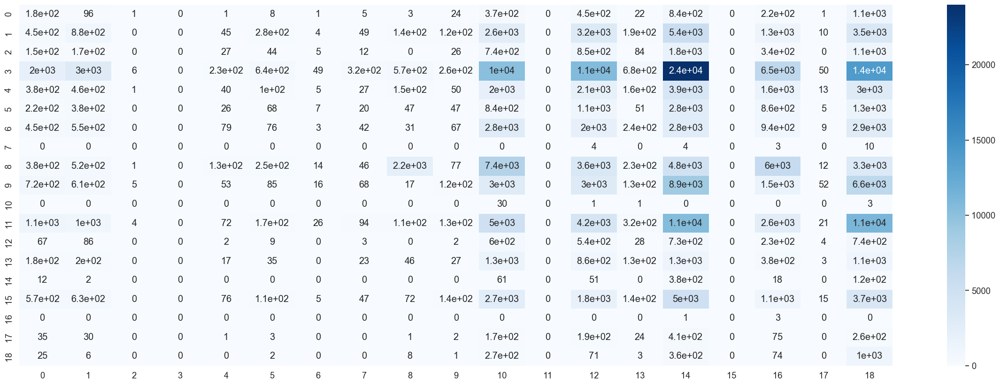

In [93]:
graph_confusion_matrix(clf_logisticRegr, X_train, y_train, X_test, y_test, train=True)

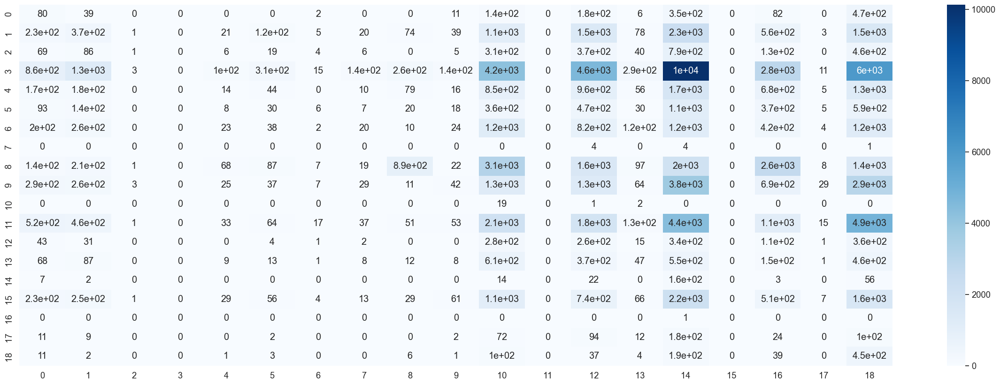

In [94]:
graph_confusion_matrix(clf_logisticRegr, X_train, y_train, X_test, y_test, train=False)

2. Damos los pesos al modelo para que haga el balanceo.

In [95]:
clf_logisticRegr = LogisticRegression(random_state=45, max_iter=300, class_weight=class_weight)

print('Iterando...')

clf_logisticRegr.fit(X_train, np.ravel(y_train))

score_train = clf_logisticRegr.score(X_train, y_train)
print('Score Train: {:2.2%}'.format(score_train))
score_test = clf_logisticRegr.score(X_test, y_test)
print('Score Test: {:2.2%}'.format(score_test))

Iterando...
Score Train: 2.22%
Score Test: 2.19%


C:\Users\Enrique\anaconda3\envs\atrium\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [96]:
print_score(clf_logisticRegr, X_train, y_train, X_test, y_test, train=True)

Train Result:
Accuracy Score: 2.22%
_______________________________________________
CLASSIFICATION REPORT:
                     0             1       2        3             4  \
precision     0.026286      0.101147     0.0      NaN      0.049383   
recall        0.056334      0.048748     0.0      0.0      0.002849   
f1-score      0.035846      0.065789     0.0      0.0      0.005388   
support    3284.000000  18093.000000  5310.0  73216.0  14038.000000   

                     5             6     7             8             9  ...  \
precision     0.035975      0.021277   0.0      0.651129      0.106814  ...   
recall        0.008892      0.000231   0.0      0.076557      0.004661  ...   
f1-score      0.014259      0.000457   0.0      0.137006      0.008933  ...   
support    7760.000000  12994.000000  21.0  29011.000000  24886.000000  ...   

                    12           13          14       15        16      17  \
precision     0.015544     0.053230    0.005148      NaN  0.000

In [97]:
print_score(clf_logisticRegr, X_train, y_train, X_test, y_test, train=False)

Test Result:
Accuracy Score: 2.19%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2        3            4  \
precision     0.027071     0.100135     0.090909      NaN     0.040580   
recall        0.060850     0.046907     0.000434      0.0     0.002311   
f1-score      0.037472     0.063887     0.000863      0.0     0.004372   
support    1364.000000  7888.000000  2306.000000  31187.0  6059.000000   

                     5            6    7             8             9  ...  \
precision     0.036686     0.028571  0.0      0.619611      0.098876  ...   
recall        0.009448     0.000362  0.0      0.072830      0.004063  ...   
f1-score      0.015027     0.000715  0.0      0.130339      0.007806  ...   
support    3281.000000  5528.000000  9.0  12234.000000  10829.000000  ...   

                    12           13          14      15   16     17  \
precision     0.017547     0.044944    0.005176     NaN  0.0    0.

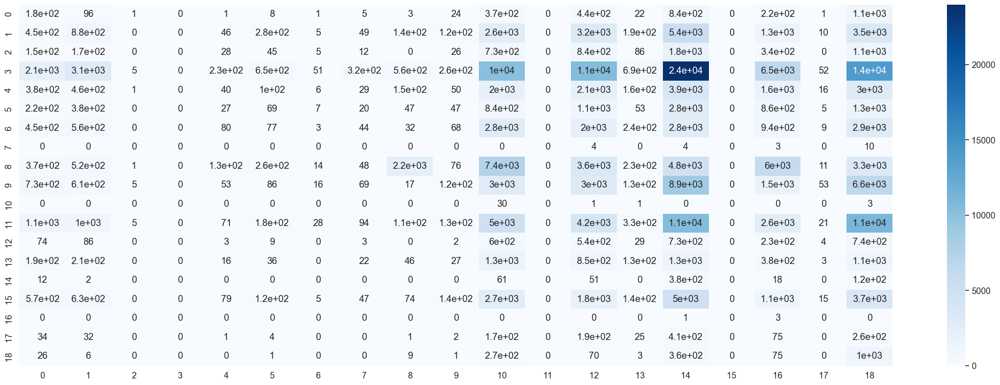

In [98]:
graph_confusion_matrix(clf_logisticRegr, X_train, y_train, X_test, y_test, train=True)

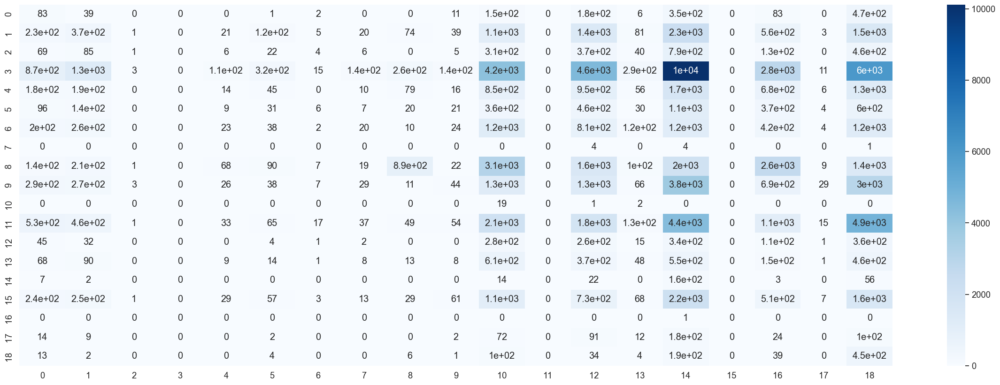

In [99]:
graph_confusion_matrix(clf_logisticRegr, X_train, y_train, X_test, y_test, train=False)

- Variable de entrada: X_tags

1. El modelo balancea la clase de forma automática.

In [100]:
clf_logisticRegr = LogisticRegression(random_state=45, max_iter=300, class_weight='balanced')

print('Iterando...')

clf_logisticRegr.fit(X_train_tags, np.ravel(y_train_tags))

score_train = clf_logisticRegr.score(X_train_tags, y_train_tags)
print('Score Train: {:2.2%}'.format(score_train))
score_test = clf_logisticRegr.score(X_test_tags, y_test_tags)
print('Score Test: {:2.2%}'.format(score_test))

Iterando...


C:\Users\Enrique\anaconda3\envs\atrium\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Score Train: 2.96%
Score Test: 2.98%


In [101]:
print_score(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=True)

Train Result:
Accuracy Score: 2.96%
_______________________________________________
CLASSIFICATION REPORT:
                 0         1              2          3              4  \
precision      NaN       NaN       0.025445        NaN       0.037500   
recall         0.0       0.0       0.097800        0.0       0.000036   
f1-score       0.0       0.0       0.040384        0.0       0.000072   
support    60427.0  363760.0  106094.000000  1386803.0  248209.000000   

                       5              6           7              8  \
precision       0.089888       0.009804    0.000309       0.261586   
recall          0.000605       0.000007    0.173034       0.208825   
f1-score        0.001202       0.000015    0.000616       0.232247   
support    132270.000000  266956.000000  445.000000  464815.000000   

                       9  ...            12            13            14  \
precision       0.078947  ...      0.013021      0.018395      0.004823   
recall          0.000008  

In [102]:
print_score(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=False)

Test Result:
Accuracy Score: 2.98%
_______________________________________________
CLASSIFICATION REPORT:
                 0         1             2         3              4  \
precision      0.0       NaN      0.025221       NaN       0.020619   
recall         0.0       0.0      0.097842       0.0       0.000019   
f1-score       0.0       0.0      0.040105       0.0       0.000037   
support    26194.0  155885.0  45236.000000  592928.0  106823.000000   

                      5              6           7              8  \
precision      0.072464       0.010989    0.000197       0.261566   
recall         0.000529       0.000009    0.118644       0.209200   
f1-score       0.001051       0.000017    0.000394       0.232470   
support    56671.000000  114686.000000  177.000000  198987.000000   

                       9  ...            12            13           14  \
precision       0.125000  ...      0.013131      0.023973     0.004720   
recall          0.000012  ...      0.039377 

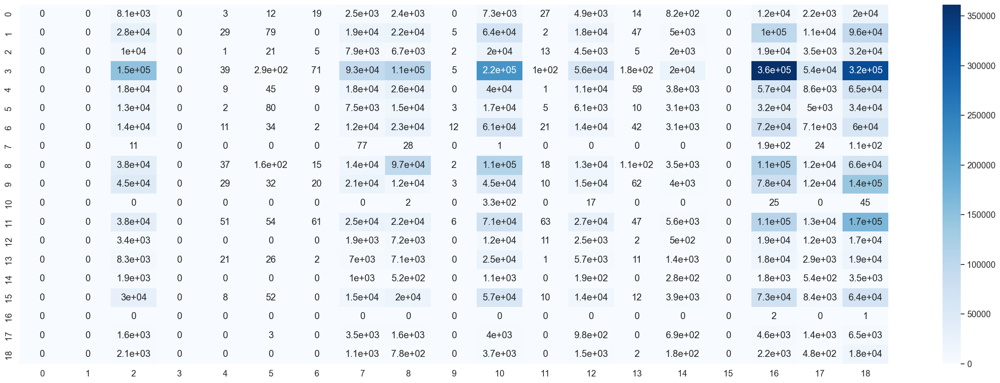

In [103]:
graph_confusion_matrix(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=True)

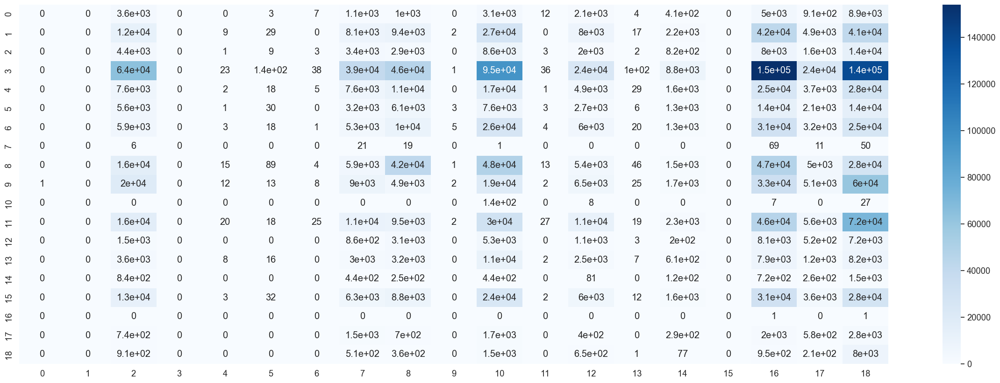

In [104]:
graph_confusion_matrix(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=False)

2. Damos los pesos al modelo para que haga el balanceo.

In [105]:
clf_logisticRegr = LogisticRegression(random_state=45, max_iter=300, class_weight=class_weight)

print('Iterando...')

clf_logisticRegr.fit(X_train_tags, np.ravel(y_train_tags))

score_train = clf_logisticRegr.score(X_train_tags, y_train_tags)
print('Score Train: {:2.2%}'.format(score_train))
score_test = clf_logisticRegr.score(X_test_tags, y_test_tags)
print('Score Test: {:2.2%}'.format(score_test))

Iterando...


C:\Users\Enrique\anaconda3\envs\atrium\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Score Train: 1.22%
Score Test: 1.22%


In [106]:
print_score(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=True)

Train Result:
Accuracy Score: 1.22%
_______________________________________________
CLASSIFICATION REPORT:
                 0         1              2          3         4         5  \
precision      NaN       NaN       0.021482        NaN       NaN       NaN   
recall         0.0       0.0       0.027117        0.0       0.0       0.0   
f1-score       0.0       0.0       0.023973        0.0       0.0       0.0   
support    60427.0  363760.0  106094.000000  1386803.0  248209.0  132270.0   

                  6      7         8         9  ...            12       13  \
precision       NaN    NaN       NaN       NaN  ...      0.017095      NaN   
recall          0.0    0.0       0.0       0.0  ...      0.532873      0.0   
f1-score        0.0    0.0       0.0       0.0  ...      0.033127      0.0   
support    266956.0  445.0  464815.0  372980.0  ...  65282.000000  95044.0   

                14        15   16            17       18  accuracy  \
precision      NaN       NaN  NaN      0.

In [107]:
print_score(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=False)

Test Result:
Accuracy Score: 1.22%
_______________________________________________
CLASSIFICATION REPORT:
                 0         1             2         3         4        5  \
precision      NaN       NaN      0.020814       NaN       NaN      NaN   
recall         0.0       0.0      0.026439       0.0       0.0      0.0   
f1-score       0.0       0.0      0.023292       0.0       0.0      0.0   
support    26194.0  155885.0  45236.000000  592928.0  106823.0  56671.0   

                  6      7         8         9  ...            12       13  \
precision       NaN    NaN       NaN       NaN  ...      0.017110      NaN   
recall          0.0    0.0       0.0       0.0  ...      0.533465      0.0   
f1-score        0.0    0.0       0.0       0.0  ...      0.033157      0.0   
support    114686.0  177.0  198987.0  160359.0  ...  27910.000000  41015.0   

               14        15   16            17       18  accuracy  \
precision     NaN       NaN  NaN      0.007132      NaN  0

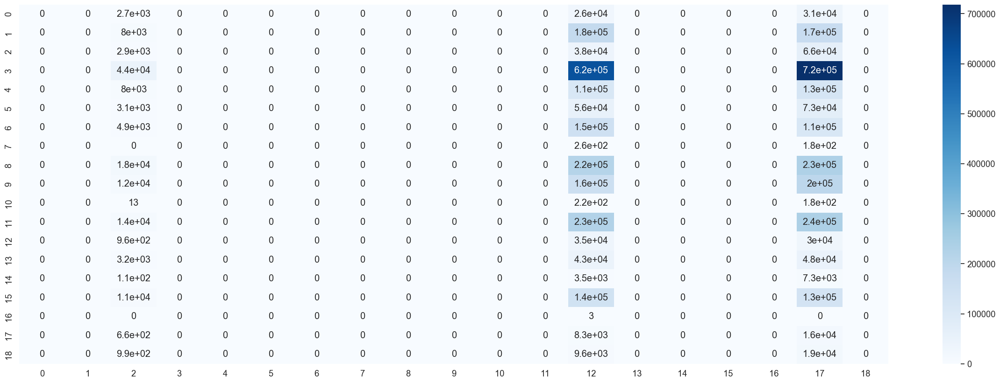

In [108]:
graph_confusion_matrix(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=True)

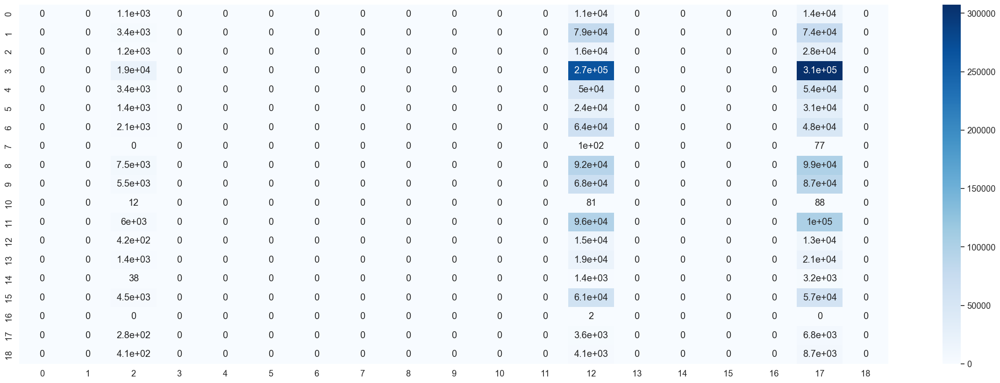

In [109]:
graph_confusion_matrix(clf_logisticRegr, X_train_tags, y_train_tags, X_test_tags, y_test_tags, train=False)

### Resultados Regresión Logísitica

Dado que, como hemos visto, no hay correlación lineal entre las variables, el algoritmo de regresión lineal ofrece muy malos resultados. Además, da muchos problemas de convergencia.<br>
En cuanto a las dos versiones equilibradas del dataset, X_balanced ofrece mejores resultados que X_tags_balanced, tanto en accuracy como en identificación de clases, pero aún así son resultados realmente malos.

# Random Forest

In [110]:
from sklearn.ensemble import RandomForestClassifier

In [111]:
clf_rf = RandomForestClassifier(random_state=42, n_jobs=-1, verbose=1)

### Muestreo del conjunto de entrenamiento

Por capacidad computacional, para Cross Validation voy a trabajar con un muestreo del dataset y no con el dataset completo.

In [112]:
# porcentaje de muestreo
sample_size = 0.2

# muestreo del conjunto de entrenamiento
X_train_sampled, _, y_train_sampled, _ = train_test_split(X_train, y_train, train_size=sample_size, random_state=42)

### Cross Validation

<b>Randomized Search</b><br>
Tras diferentes pruebas con Randomized Search, he acotado valores de los parámetros de Random Forest.

In [113]:
from sklearn.model_selection import RandomizedSearchCV

In [114]:
n_estimators_rs_rf=[50, 100, 150]   # núm. árboles en el bosque
criterion_rs_rf=['gini', 'entropy']
max_depth_rs_rf=[None, 500, 1000]   # profundidad máxima; 'None': no limitado
min_samples_split_rs_rf=[2, 5, 10]   # núm. mínimo de muestras para dividir un nodo; int [2, inf), float (0.0, 1.0]
min_samples_leaf_rs_rf=[1, 2, 4]   # núm. mínimo de muestras en una hoja
max_features_rs_rf=['sqrt', 'log2']   # núm. máximo de características a considerar al buscar la mejor difusión; valor numérico (int, float), 'sqrt', 'log2', None
max_leaf_nodes_rs_rf=[None, 2, 4]   # núm. máximo de nodos hoja; 'None': sin limitación; rango [2, inf)
min_impurity_decrease_rs_rf=[0.0, 1.0]   # gini, nodo se divide si la reducción en la impureza es mayor que este valor; el algoritmo no dividirá nodos que no mejoren significativamente la pureza de las hojas
bootstrap_rs_rf=[True, False]   # False, se usa todo el conjunto de datos para construir cada árbol; True: se usan muestras de bootstrap
ccp_alpha_rs_rf=[0.0, 0.5]   # poda; cuanto mayor sea, más se poda
class_weight_rs_rf=[class_weight_tags]   # pesos de las clases, {class_label: weight}

random_grid_rs_rf = {'n_estimators': n_estimators_rs_rf, 'criterion': criterion_rs_rf, 'max_depth': max_depth_rs_rf, 'min_samples_split': min_samples_split_rs_rf,\
                     'min_samples_leaf': min_samples_leaf_rs_rf, 'max_features': max_features_rs_rf, 'max_leaf_nodes': max_leaf_nodes_rs_rf,\
                     'bootstrap': bootstrap_rs_rf, 'ccp_alpha': ccp_alpha_rs_rf, 'class_weight':class_weight_rs_rf}

In [115]:
print('Iterando...')

rf_rscv = RandomizedSearchCV(estimator=clf_rf, param_distributions=random_grid_rs_rf, scoring=None, n_iter=100, cv=4, verbose=1, random_state=42, n_jobs=3, error_score='raise')
rf_rscv.fit(X_train, np.ravel(y_train))

best_params_rf_rscv = rf_rscv.best_params_
print(f"Best paramters: {best_params_rf_rscv})")

Iterando...
Fitting 4 folds for each of 100 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   20.6s


Best paramters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_leaf_nodes': None, 'max_features': 'sqrt', 'max_depth': None, 'criterion': 'gini', 'class_weight': {17: 9.267729598297958, 4: 0.931070610909185, 3: 0.16664234593028562, 2: 2.1782580095307735, 1: 0.6353092843170164, 15: 0.8086955032321836, 6: 0.8656861252909015, 11: 0.48572994029403965, 9: 0.6196045505473695, 8: 0.49718727937600526, 13: 2.431506515541832, 0: 3.8244510775507288, 12: 3.5400279596697084, 18: 7.688984071837832, 5: 1.747184586551432, 14: 21.295623411643742, 7: 519.3260792430515, 10: 547.6305811923173, 16: 77033.36842105263}, 'ccp_alpha': 0.0, 'bootstrap': False})


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   56.5s finished


<b>Grid Search</b><br>
A partir de los mejores parámetros de Randomized Search, escogemos parámetros para Grid Search

In [116]:
from sklearn.model_selection import GridSearchCV

In [117]:
n_estimators_gs_rf=list(range(80, 101, 10))
criterion_gs_rf=['gini', 'entropy']
max_depth_gs_rf=[None]
min_samples_split_gs_rf=list(range(4, 6))
min_samples_leaf_gs_rf=list(range(1, 3))
max_features_gs_rf=['sqrt']
max_features_gs_rf.append(None)
max_leaf_nodes_gs_rf=[None]
min_impurity_decrease_gs_rf=[0.0]
ccp_alpha_gs_rf=[0.0]
bootstrap_gs_rf=[False]
class_weight_gs_rf=[class_weight_tags]   # pesos de las clases, {class_label: weight}

random_grid_gs_rf = {'n_estimators': n_estimators_gs_rf, 'criterion': criterion_gs_rf, 'max_depth': max_depth_gs_rf, 'min_samples_split': min_samples_split_gs_rf,\
                     'min_samples_leaf': min_samples_leaf_gs_rf, 'max_features': max_features_gs_rf, 'max_leaf_nodes': max_leaf_nodes_gs_rf, 'min_impurity_decrease': min_impurity_decrease_gs_rf,\
                     'bootstrap': bootstrap_gs_rf, 'ccp_alpha': ccp_alpha_gs_rf, 'class_weight':class_weight_gs_rf}

In [118]:
print('Iterando...')

rf_gscv = GridSearchCV(estimator=clf_rf, param_grid=random_grid_gs_rf, scoring=None, cv=2, verbose=1, n_jobs=-1, error_score='raise')
rf_gscv.fit(X_train, np.ravel(y_train))

best_params_rf_gscv = rf_gscv.best_params_
print(f"Best parameters: {best_params_rf_gscv}")

Iterando...
Fitting 2 folds for each of 48 candidates, totalling 96 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   19.6s


Best parameters: {'bootstrap': False, 'ccp_alpha': 0.0, 'class_weight': {17: 9.267729598297958, 4: 0.931070610909185, 3: 0.16664234593028562, 2: 2.1782580095307735, 1: 0.6353092843170164, 15: 0.8086955032321836, 6: 0.8656861252909015, 11: 0.48572994029403965, 9: 0.6196045505473695, 8: 0.49718727937600526, 13: 2.431506515541832, 0: 3.8244510775507288, 12: 3.5400279596697084, 18: 7.688984071837832, 5: 1.747184586551432, 14: 21.295623411643742, 7: 519.3260792430515, 10: 547.6305811923173, 16: 77033.36842105263}, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 100}


[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   54.1s finished


### Random Forest

Aplicamos Random Forest al conjunto de entrenamiento del dataset completo.

In [119]:
print('Iterando...')

clf_rf = RandomForestClassifier(**best_params_rf_gscv)
clf_rf.fit(X_train, np.ravel(y_train))

print('Acabado')

Iterando...
Acabado


In [120]:
print_score(clf_rf, X_train, y_train, X_test, y_test, train=True)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
                0             1       2             3        4            5  \
precision     1.0      0.999945     1.0      1.000000      1.0     0.999614   
recall        1.0      1.000000     1.0      0.999850      1.0     1.000000   
f1-score      1.0      0.999972     1.0      0.999925      1.0     0.999807   
support    3284.0  18093.000000  5310.0  73216.000000  14038.0  7760.000000   

                      6     7        8        9  ...      12      13     14  \
precision      0.999923   1.0      1.0      1.0  ...     1.0     1.0    1.0   
recall         1.000000   1.0      1.0      1.0  ...     1.0     1.0    1.0   
f1-score       0.999962   1.0      1.0      1.0  ...     1.0     1.0    1.0   
support    12994.000000  21.0  29011.0  24886.0  ...  3049.0  5634.0  643.0   

                     15   16      17      18  accuracy      macro avg  \
precision      0.999938  1

In [121]:
print_score(clf_rf, X_train, y_train, X_test, y_test, train=False)

Test Result:
Accuracy Score: 78.65%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2             3            4  \
precision     0.854359     0.892062     0.879452      0.766088     0.895681   
recall        0.610704     0.792089     0.696010      0.865745     0.708533   
f1-score      0.712270     0.839108     0.777052      0.812874     0.791191   
support    1364.000000  7888.000000  2306.000000  31187.000000  6059.000000   

                     5            6         7             8             9  \
precision     0.869207     0.808938  1.000000      0.885940      0.765017   
recall        0.674489     0.772793  0.777778      0.815841      0.762120   
f1-score      0.759568     0.790452  0.875000      0.849447      0.763566   
support    3281.000000  5528.000000  9.000000  12234.000000  10829.000000   

           ...           12           13          14           15   16  \
precision  ...     0.883320     0.920

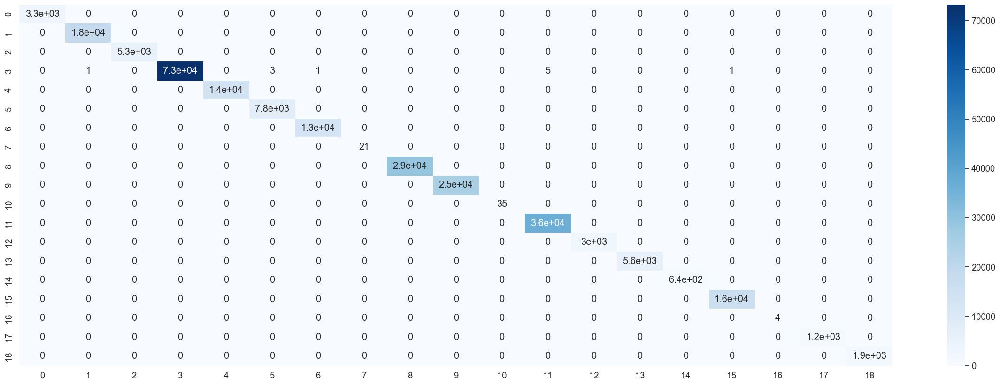

In [122]:
graph_confusion_matrix(clf_rf, X_train, y_train, X_test, y_test, train=True)

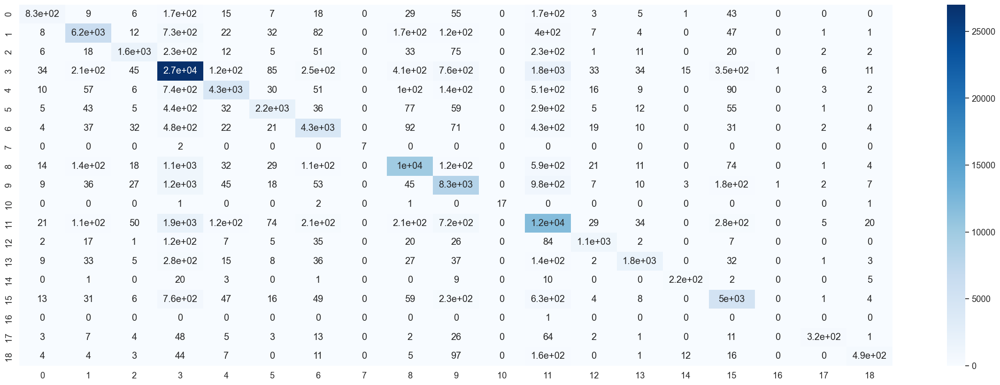

In [123]:
graph_confusion_matrix(clf_rf, X_train, y_train, X_test, y_test, train=False)

<b>Peso de las características</b>

In [124]:
# estudio del peso de las características
valor_caracteristicas = clf_rf.feature_importances_

# unimos las características con su peso
features = X_train.columns
valor_caracteristicas_df = pd.DataFrame({'característica': features, 'peso': valor_caracteristicas}, )
valor_caracteristicas_df = valor_caracteristicas_df.set_index('característica')

# ordenamos por peso
valor_caracteristicas_df = valor_caracteristicas_df.sort_values(by='peso', ascending=False)

valor_caracteristicas_df

,peso
característica,
comment_count_encoded,0.161426
channel_title_encoded,0.111906
likes_encoded,0.109278
ratio_interaccion_dia_encoded,0.109152
dislikes_encoded,0.104680
tags_encoded,0.104590
views_encoded,0.075124
ratio_viralidad,0.073718
country_encoded,0.049679


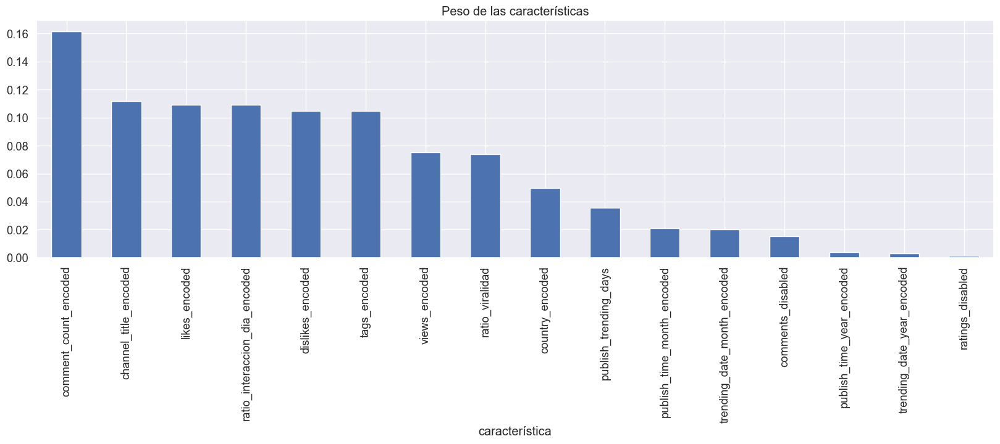

In [125]:
# graficamos
sns.set(font_scale=1.2)
plt.figure(figsize=(20, 5))

valor_caracteristicas_df['peso'].plot.bar()
plt.title('Peso de las características')
plt.show()

Tras diversas pruebas podemos ver que:
- Las variables que menos importancia tienen del dataset son ratings_disabled, trending_date_year y publish_time_year, seguidas muy de cerca por comments_disabled.<br>
- trending_date_month y publish_time_month son las siguientes variables de menor peso, ambas con valores muy similares.<br>
- publish_trending_days tiene un peso algo mayor que las dos anteriores, pero algo inferior a ratio_viralidad, views y country, que muestran valores más cercanos al resto de variables de mayor peso.<br>
- Destaca comment_count como la variable de mayor peso del dataset.

<b>Random Forest sin las características de menor peso</b><br>
Vamos a repetir Random Forest sin contar con las variables que acabamos de ver que menos información aportan. Para ello vamos a hacer varias pruebas.

- Eliminar las 4 características de menor peso:
   - ratings_disabled
   - trending_date_year
   - publish_time_year
   - comments_disabled

In [126]:
X_train_reduced_1 = X_train.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled'], axis='columns')

X_train_reduced_1.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded',
       'trending_date_month_encoded', 'publish_time_month_encoded',
       'publish_trending_days'],
      dtype='object')

In [127]:
X_test_reduced_1 = X_test.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled'], axis='columns')

X_test_reduced_1.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded',
       'trending_date_month_encoded', 'publish_time_month_encoded',
       'publish_trending_days'],
      dtype='object')

In [128]:
clf_rf_reduced_1 = RandomForestClassifier(random_state=42, n_jobs=-1, verbose=1)

Usamos los mejores parámetros resultantes de Cross Validation

In [129]:
print('Iterando...')

clf_rf_reduced_1 = RandomForestClassifier(**best_params_rf_gscv)
clf_rf_reduced_1.fit(X_train_reduced_1, np.ravel(y_train))

print('Acabado')

Iterando...
Acabado


In [130]:
print_score(clf_rf_reduced_1, X_train_reduced_1, y_train, X_test_reduced_1, y_test, train=True)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
                0        1       2             3        4            5  \
precision     1.0      1.0     1.0      1.000000      1.0     0.999742   
recall        1.0      1.0     1.0      0.999918      1.0     1.000000   
f1-score      1.0      1.0     1.0      0.999959      1.0     0.999871   
support    3284.0  18093.0  5310.0  73216.000000  14038.0  7760.000000   

                 6     7        8        9  ...           12      13     14  \
precision      1.0   1.0      1.0      1.0  ...     0.999672     1.0    1.0   
recall         1.0   1.0      1.0      1.0  ...     1.000000     1.0    1.0   
f1-score       1.0   1.0      1.0      1.0  ...     0.999836     1.0    1.0   
support    12994.0  21.0  29011.0  24886.0  ...  3049.000000  5634.0  643.0   

                15   16      17      18  accuracy      macro avg  \
precision      1.0  1.0     1.0     1.0  0.999976       

In [131]:
print_score(clf_rf_reduced_1, X_train_reduced_1, y_train, X_test_reduced_1, y_test, train=False)

Test Result:
Accuracy Score: 78.55%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2             3            4  \
precision     0.846939     0.891295     0.880351      0.764771     0.893255   
recall        0.608504     0.798301     0.695577      0.863693     0.701601   
f1-score      0.708191     0.842239     0.777132      0.811228     0.785912   
support    1364.000000  7888.000000  2306.000000  31187.000000  6059.000000   

                     5            6         7             8             9  \
precision     0.882612     0.812287  1.000000      0.883205      0.760478   
recall        0.671442     0.774964  0.777778      0.817149      0.757318   
f1-score      0.762680     0.793186  0.875000      0.848894      0.758895   
support    3281.000000  5528.000000  9.000000  12234.000000  10829.000000   

           ...           12           13          14           15   16  \
precision  ...     0.891010     0.921

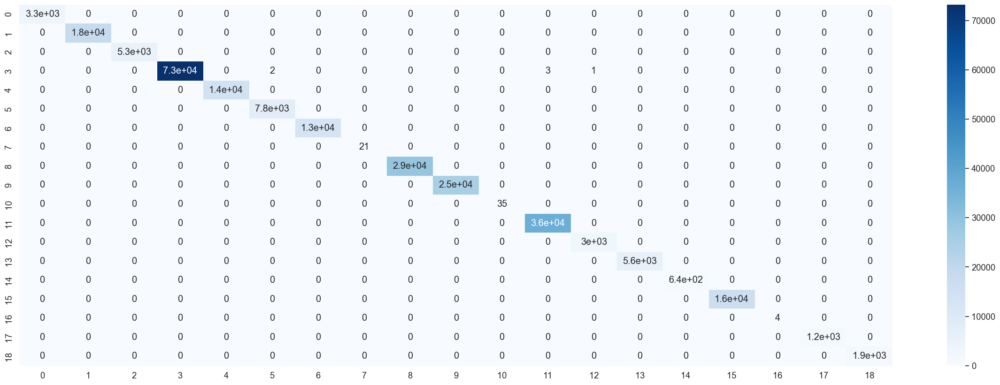

In [132]:
graph_confusion_matrix(clf_rf_reduced_1, X_train_reduced_1, y_train, X_test_reduced_1, y_test, train=True)

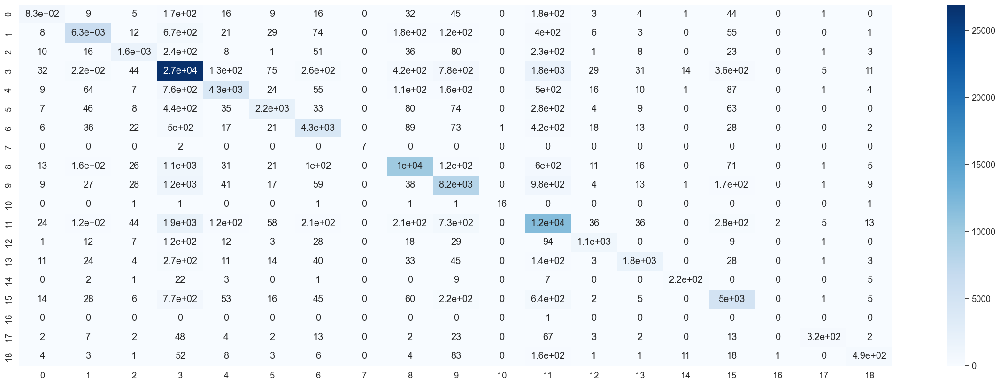

In [133]:
graph_confusion_matrix(clf_rf_reduced_1, X_train_reduced_1, y_train, X_test_reduced_1, y_test, train=False)

- Eliminar las 6 características de menor peso<br>
Eliminamos también:
   - trending_date_month
   - publish_time_month

In [134]:
X_train_reduced_2 = X_train.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded'], axis='columns')

X_train_reduced_2.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded',
       'publish_trending_days'],
      dtype='object')

In [135]:
X_test_reduced_2 = X_test.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded'], axis='columns')

X_test_reduced_2.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded',
       'publish_trending_days'],
      dtype='object')

In [136]:
clf_rf_reduced_2 = RandomForestClassifier(random_state=42, n_jobs=-1, verbose=1)

In [137]:
print('Iterando...')

clf_rf_reduced_2 = RandomForestClassifier(**best_params_rf_gscv)
clf_rf_reduced_2.fit(X_train_reduced_2, np.ravel(y_train))

print('Acabado')

Iterando...
Acabado


In [138]:
print_score(clf_rf_reduced_2, X_train_reduced_2, y_train, X_test_reduced_2, y_test, train=True)

Train Result:
Accuracy Score: 99.99%
_______________________________________________
CLASSIFICATION REPORT:
                0             1       2             3             4  \
precision     1.0      0.999779     1.0      1.000000      0.999858   
recall        1.0      1.000000     1.0      0.999809      0.999929   
f1-score      1.0      0.999889     1.0      0.999904      0.999893   
support    3284.0  18093.000000  5310.0  73216.000000  14038.000000   

                     5        6     7             8        9  ...  \
precision     0.999871      1.0   1.0      0.999966      1.0  ...   
recall        1.000000      1.0   1.0      1.000000      1.0  ...   
f1-score      0.999936      1.0   1.0      0.999983      1.0  ...   
support    7760.000000  12994.0  21.0  29011.000000  24886.0  ...   

                    12           13     14            15   16      17      18  \
precision     0.999344     0.999823    1.0      0.999938  1.0     1.0     1.0   
recall        1.000000     1

In [139]:
print_score(clf_rf_reduced_2, X_train_reduced_2, y_train, X_test_reduced_2, y_test, train=False)

Test Result:
Accuracy Score: 79.39%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2             3            4  \
precision     0.843658     0.886256     0.889247      0.780879     0.877306   
recall        0.629032     0.806034     0.717259      0.865809     0.722231   
f1-score      0.720706     0.844244     0.794047      0.821154     0.792251   
support    1364.000000  7888.000000  2306.000000  31187.000000  6059.000000   

                     5            6         7             8             9  \
precision     0.854497     0.822456  1.000000      0.880007      0.775290   
recall        0.689119     0.791064  0.777778      0.822462      0.770708   
f1-score      0.762949     0.806455  0.875000      0.850262      0.772992   
support    3281.000000  5528.000000  9.000000  12234.000000  10829.000000   

           ...           12           13          14           15   16  \
precision  ...     0.877692     0.919

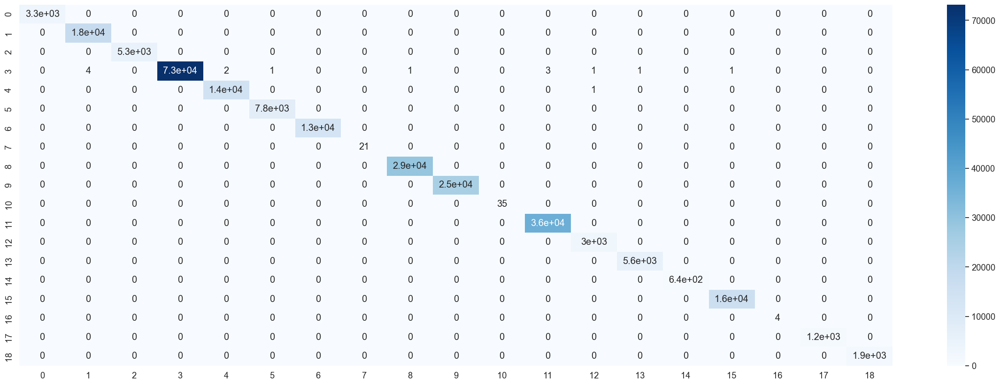

In [140]:
graph_confusion_matrix(clf_rf_reduced_2, X_train_reduced_2, y_train, X_test_reduced_2, y_test, train=True)

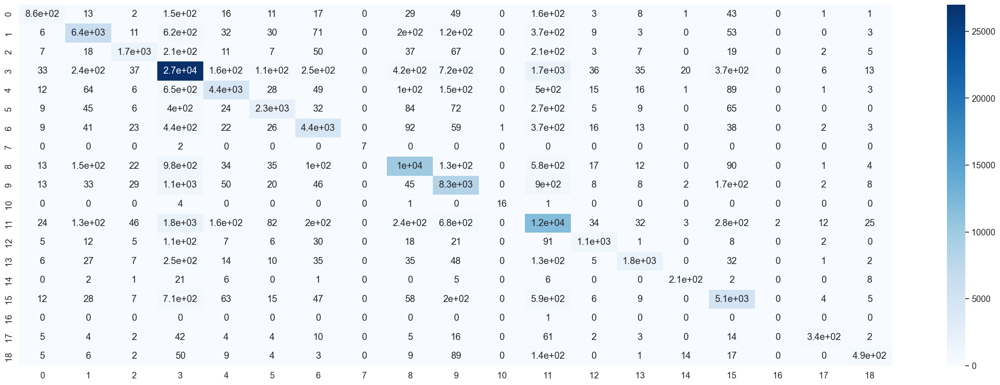

In [141]:
graph_confusion_matrix(clf_rf_reduced_2, X_train_reduced_2, y_train, X_test_reduced_2, y_test, train=False)

- Eliminar las 7 características de menor peso
   - eliminamos también publish_trending_days

In [142]:
X_train_reduced_3 = X_train.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded', 'publish_trending_days'], axis='columns')

X_train_reduced_3.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded'],
      dtype='object')

In [143]:
X_test_reduced_3 = X_test.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded', 'publish_trending_days'], axis='columns')

X_test_reduced_3.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded'],
      dtype='object')

In [144]:
clf_rf_reduced_3 = RandomForestClassifier(random_state=42, n_jobs=-1, verbose=1)

In [145]:
print('Iterando...')

clf_rf_reduced_3 = RandomForestClassifier(**best_params_rf_gscv)
clf_rf_reduced_3.fit(X_train_reduced_3, np.ravel(y_train))

print('Acabado')

Iterando...
Acabado


In [146]:
print_score(clf_rf_reduced_3, X_train_reduced_3, y_train, X_test_reduced_3, y_test, train=True)

Train Result:
Accuracy Score: 99.99%
_______________________________________________
CLASSIFICATION REPORT:
                0             1            2             3             4  \
precision     1.0      0.999945     0.999812      1.000000      1.000000   
recall        1.0      0.999945     1.000000      0.999795      0.999929   
f1-score      1.0      0.999945     0.999906      0.999898      0.999964   
support    3284.0  18093.000000  5310.000000  73216.000000  14038.000000   

                     5             6     7        8            9  ...  \
precision     0.999871      0.999923   1.0      1.0      1.00000  ...   
recall        1.000000      1.000000   1.0      1.0      0.99996  ...   
f1-score      0.999936      0.999962   1.0      1.0      0.99998  ...   
support    7760.000000  12994.000000  21.0  29011.0  24886.00000  ...   

                    12           13          14            15   16      17  \
precision     0.999017     0.999823    0.998447      0.999814  1.0 

In [147]:
print_score(clf_rf_reduced_3, X_train_reduced_3, y_train, X_test_reduced_3, y_test, train=False)

Test Result:
Accuracy Score: 80.47%
_______________________________________________
CLASSIFICATION REPORT:
                     0            1            2             3            4  \
precision     0.851961     0.897628     0.888947      0.797165     0.883153   
recall        0.637097     0.820360     0.732437      0.872671     0.739726   
f1-score      0.729027     0.857256     0.803138      0.833211     0.805101   
support    1364.000000  7888.000000  2306.000000  31187.000000  6059.000000   

                     5            6         7             8             9  \
precision     0.855408     0.831770  1.000000      0.887415      0.783304   
recall        0.708625     0.802279  0.777778      0.831126      0.786776   
f1-score      0.775129     0.816759  0.875000      0.858349      0.785036   
support    3281.000000  5528.000000  9.000000  12234.000000  10829.000000   

           ...           12           13          14           15   16  \
precision  ...     0.882353     0.919

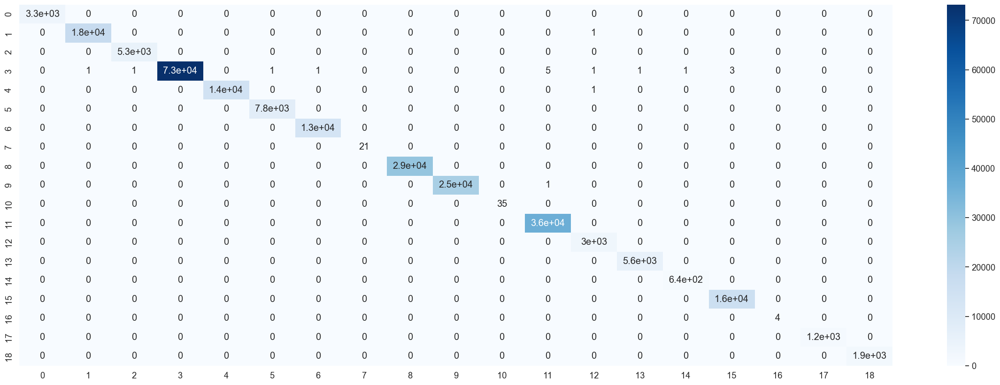

In [148]:
graph_confusion_matrix(clf_rf_reduced_3, X_train_reduced_3, y_train, X_test_reduced_3, y_test, train=True)

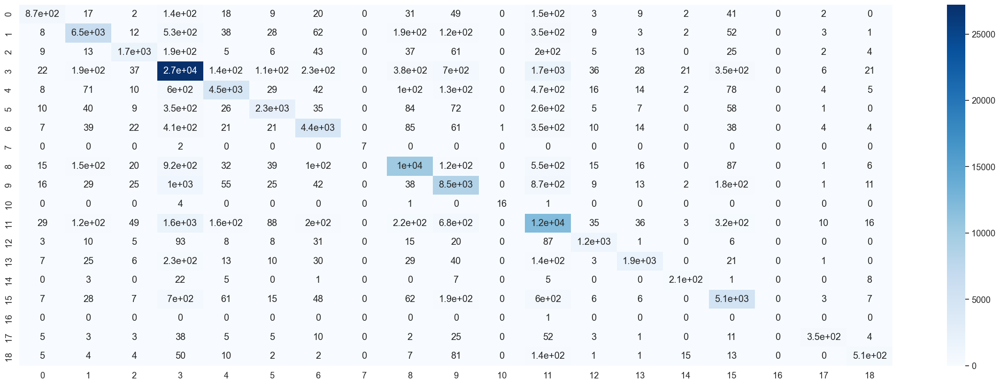

In [149]:
graph_confusion_matrix(clf_rf_reduced_3, X_train_reduced_3, y_train, X_test_reduced_3, y_test, train=False)

### Resultados de Random Forest

En todas las pruebas realizadas con Random Forest, el conjunto de entrenamiento obtiene un accuracy del 100,00%<br>
Con la versión del dataset con todas las variables, se obtiene en el conjunto de pruebas un accuracy en torno al 78,5%. Este valor aumenta a medida que eliminamos las caracterísitcas de menor peso, llegando a superar el 80,00% sin las 7 variables de menor peso.<br>
En cuanto a las matrices de confusión, todas son similares, identifican muy bien las clases en entrenamiento y hay más errores en las pruebas, sin haber grandes diferencias entre todas las versiones del dataset empleadas.

# MLP (Perceptrones Multicapa)

In [150]:
from sklearn.neural_network import MLPClassifier

<b>Balancear la variable objetivo</b>

No nos vale lo hecho antes, aquí necesitamos un conjunto de entrenamiento balanceado.

In [151]:
from imblearn.combine import SMOTEENN
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

In [152]:
# obtenemos el número de muestras por clase
class_distribution = Counter(y_train['category_encoded'])
class_distribution

Counter({3: 73216,
         11: 36424,
         8: 29011,
         9: 24886,
         1: 18093,
         15: 16142,
         4: 14038,
         6: 12994,
         5: 7760,
         13: 5634,
         2: 5310,
         0: 3284,
         12: 3049,
         18: 1861,
         17: 1193,
         14: 643,
         10: 35,
         7: 21,
         16: 4})

In [153]:
class_counts = np.array(list(class_distribution.values()))
class_counts

array([36424,  7760, 24886, 29011, 73216,  5310, 12994, 18093, 16142,
       14038,  5634,  3284,  3049,  1861,  1193,   643,    35,    21,
           4])

In [154]:
# calculamos los percentiles superior e inferior que van a definir las clases a modificar
# tras diferentes pruebas, usamos estos percentiles:
perc_sup = 70
perc_inf = 30
percentile_sup = np.percentile(class_counts, perc_sup)
percentile_inf = np.percentile(class_counts, perc_inf)

print(f"Percentil {perc_sup}: {percentile_sup}, Percentil {perc_inf}: {percentile_inf}")

Percentil 70: 15300.4, Percentil 30: 2336.1999999999994


In [155]:
# definimos las estrategias de oversampling y undersampling
oversample_strategy = {cls: int(percentile_inf) for cls, count in class_distribution.items() if count < percentile_inf}
undersample_strategy = {cls: int(percentile_sup) for cls, count in class_distribution.items() if count > percentile_sup}

In [156]:
# SMOTE utiliza el parámetro n_neighbors por defecto a 5, vamos a comprobar si el número mínimo de muestras de las clases es inferior o igual a este valor, en cuyo caso hay que reducirlo
# valor mínimo de muestras de las clases
min_samples_class = y_train.value_counts().min()
print(min_samples_class)

# se selecciona el n_neighbors necesario
n_neighbors = min(min_samples_class - 1, 5)
print(n_neighbors)

4
3


In [157]:
# SMOTE para oversampling en las clases minoritarias
smote = SMOTE(sampling_strategy=oversample_strategy, random_state=42, k_neighbors=n_neighbors)

X_train_over, y_train_over = smote.fit_resample(X_train, y_train)

In [158]:
# RandomUnderSampler para las clases mayoritarias
undersampler = RandomUnderSampler(sampling_strategy=undersample_strategy, random_state=42)

X_train_balanced, y_train_balanced = undersampler.fit_resample(X_train_over, y_train_over)

<b>Muestreo de los datos de entrada</b><br>
Por necesidades computacionales, utilizo un muestreo en vez de los datos completos para entrenar el algoritmo.

In [159]:
# porcentaje de muestreo
sample_size = 0.2

# muestreo del conjunto de entrenamiento
X_train_sampled, _, y_train_sampled, _ = train_test_split(X_train_balanced, y_train_balanced, train_size=sample_size, random_state=42)

<b>Randomized Search</b>

In [160]:
clf_MLP = MLPClassifier(random_state=42, verbose=True)

In [161]:
hidden_layer_sizes_rs_MLP=[(100, 100), (100, 100, 100)]   # (100,) / tamaño capas ocultas
activation_rs_MLP=['relu', 'logistic', 'identity']   #'relu': función de activación; ‘identity’, ‘logistic’, ‘tanh’
alpha_rs_MLP=[0.001]   # 0.0001 / coef. de regularización L2, controla el sobreajuste (mayor > aprendizaje conservador, menor prob. sobreajuste)
batch_size_rs_MLP=['auto']   # 'auto': tamaño de los lotes en que se divide el dataset; menor, más preciso pero más lento; 'auto': batch_size=min(200, n_samples)
learning_rate_rs_MLP=['constant', 'invscaling']   # 'constant' / ritmo de aprendizaje; invscaling: disminuye la tasa de aprendizaje a medida que avanzan las iteraciones; adaptive: tasa constante, se reduce si el error en la validación deja de mejorar
max_iter_rs_MLP=[2000, 2100]   # 200: número de épocas (cuántas veces se utiliza cada punto de datos), no número de pasos del gradiente
shuffle_rs_MLP=[True]   # True: baraja aleatoriamente los datos
early_stopping_rs_MLP=[True]
n_iter_no_change_rs_MLP=[600, 700, 800]   # 10 / uso con early_stopping

random_grid_rs_MLP = {'hidden_layer_sizes': hidden_layer_sizes_rs_MLP, 'activation': activation_rs_MLP, 'alpha': alpha_rs_MLP, 'batch_size':batch_size_rs_MLP,\
                      'learning_rate': learning_rate_rs_MLP, 'max_iter': max_iter_rs_MLP, 'shuffle': shuffle_rs_MLP, 'early_stopping':early_stopping_rs_MLP, 'n_iter_no_change':n_iter_no_change_rs_MLP}

In [162]:
print('Iterando...')

MLP_rscv = RandomizedSearchCV(estimator=clf_MLP, param_distributions=random_grid_rs_MLP, scoring=None, n_iter=36, cv=5, verbose=1, random_state=42, n_jobs=-1, error_score='raise')
MLP_rscv.fit(X_train_sampled, np.ravel(y_train_sampled))

best_params_MLP_rscv = MLP_rscv.best_params_
print(f"Best paramters: {best_params_MLP_rscv})")

Iterando...
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Iteration 1, loss = 33.06339032
Validation score: 0.056365
Iteration 2, loss = 33.19278118
Validation score: 0.099430
Iteration 3, loss = 32.77224876
Validation score: 0.086130
Iteration 4, loss = 32.84252424
Validation score: 0.085497
Iteration 5, loss = 32.61792711
Validation score: 0.072198
Iteration 6, loss = 32.57163989
Validation score: 0.089614
Iteration 7, loss = 32.31196853
Validation score: 0.100063
Iteration 8, loss = 32.05325078
Validation score: 0.083597
Iteration 9, loss = 31.99251878
Validation score: 0.095313
Iteration 10, loss = 31.70936868
Validation score: 0.106713
Iteration 11, loss = 31.71019507
Validation score: 0.094680
Iteration 12, loss = 31.72404084
Validation score: 0.046865
Iteration 13, loss = 31.19748915
Validation score: 0.094047
Iteration 14, loss = 30.88650553
Validation score: 0.067131
Iteration 15, loss = 30.10241916
Validation score: 0.105763
Iteration 16, loss = 29.71855295
Va

<b>Grid Search</b>

In [163]:
# a partir de los mejores parámetros de Randomized Search, escogemos parámetros para Grid Search

hidden_layer_sizes_gs_MLP=[(100, 100), (100, 100, 100)]   # (100,) / tamaño capas ocultas
activation_gs_MLP=['relu', 'identity']   #'relu': función de activación; ‘identity’, ‘logistic’, ‘tanh’
alpha_gs_MLP=[0.001]   # 0.0001 / coef. de regularización L2, controla el sobreajuste (mayor > aprendizaje conservador, menor prob. sobreajuste)
batch_size_gs_MLP=['auto']   # 'auto': tamaño de los lotes en que se divide el dataset; menor, más preciso pero más lento; 'auto': batch_size=min(200, n_samples)
learning_rate_gs_MLP=['constant', 'invscaling']   # 'constant' / ritmo de aprendizaje; invscaling: disminuye la tasa de aprendizaje a medida que avanzan las iteraciones; adaptive: tasa constante, se reduce si el error en la validación deja de mejorar
max_iter_gs_MLP=range(2000, 2201, 100)   # 200: número de épocas (cuántas veces se utiliza cada punto de datos), no número de pasos del gradiente
shuffle_gs_MLP=[True]   # True: baraja aleatoriamente los datos
early_stopping_gs_MLP=[True]
n_iter_no_change_gs_MLP=range(700, 901, 50)   # 10 / uso con early_stopping

random_grid_gs_MLP = {'hidden_layer_sizes': hidden_layer_sizes_gs_MLP, 'activation': activation_gs_MLP, 'alpha': alpha_gs_MLP, 'batch_size':batch_size_gs_MLP,\
                      'learning_rate': learning_rate_gs_MLP, 'max_iter': max_iter_gs_MLP, 'shuffle': shuffle_gs_MLP}

In [164]:
print('Iterando...')

MLP_gscv = GridSearchCV(estimator=clf_MLP, param_grid=random_grid_gs_MLP, scoring=None, cv=5, verbose=1, n_jobs=3, error_score='raise')
MLP_gscv.fit(X_train_balanced, np.ravel(y_train_balanced))

best_params_MLP_gscv = MLP_gscv.best_params_
print(f"Best parameters: {best_params_MLP_gscv}")

Iterando...
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Iteration 1, loss = 32.80305839
Iteration 2, loss = 32.01687527
Iteration 3, loss = 30.68672580
Iteration 4, loss = 27.40274740
Iteration 5, loss = 23.69620062
Iteration 6, loss = 22.78329132
Iteration 7, loss = 25.20819255
Iteration 8, loss = 22.55597495
Iteration 9, loss = 22.26106407
Iteration 10, loss = 22.05382629
Iteration 11, loss = 16.87207549
Iteration 12, loss = 2.73133696
Iteration 13, loss = 2.72549102
Iteration 14, loss = 2.64437057
Iteration 15, loss = 2.65293181
Iteration 16, loss = 2.65899833
Iteration 17, loss = 18.43846326
Iteration 18, loss = 3.62606556
Iteration 19, loss = 2.87355104
Iteration 20, loss = 2.70097236
Iteration 21, loss = 2.65770073
Iteration 22, loss = 4.71227502
Iteration 23, loss = 9.76559995
Iteration 24, loss = 2.67130338
Iteration 25, loss = 2.61726307
Iteration 26, loss = 2.61211300
Iteration 27, loss = 2.60569142
Iteration 28, loss = 5.20703806
Iteration 29, loss = 7.2994

<b>MLP</b>

In [165]:
print('Iterando...')

clf_MLP = MLPClassifier(**best_params_MLP_gscv)
clf_MLP.fit(X_train_balanced, np.ravel(y_train_balanced))

print('Acabado')

Iterando...
Acabado


<b>Evalucación</b>

In [166]:
print_score(clf_MLP, X_train, y_train, X_test, y_test, train=True)

Train Result:
Accuracy Score: 14.87%
_______________________________________________
CLASSIFICATION REPORT:
                0             1       2             3             4       5  \
precision     NaN      0.178841     0.0      0.500000      0.065682     NaN   
recall        0.0      0.035318     0.0      0.000027      0.009189     0.0   
f1-score      0.0      0.058986     0.0      0.000055      0.016123     0.0   
support    3284.0  18093.000000  5310.0  73216.000000  14038.000000  7760.0   

                      6     7             8             9  ...      12  \
precision      0.073105   NaN      0.465280      0.134665  ...     NaN   
recall         0.271818   0.0      0.380166      0.198827  ...     0.0   
f1-score       0.115222   0.0      0.418439      0.160574  ...     0.0   
support    12994.000000  21.0  29011.000000  24886.000000  ...  3049.0   

               13     14            15        16      17      18  accuracy  \
precision     NaN    NaN      0.100024  0.00018

In [167]:
print_score(clf_MLP, X_train, y_train, X_test, y_test, train=False)

Test Result:
Accuracy Score: 14.58%
_______________________________________________
CLASSIFICATION REPORT:
                0            1       2        3            4       5  \
precision     NaN     0.192259     0.0      NaN     0.055844     NaN   
recall        0.0     0.038413     0.0      0.0     0.007097     0.0   
f1-score      0.0     0.064032     0.0      0.0     0.012593     0.0   
support    1364.0  7888.000000  2306.0  31187.0  6059.000000  3281.0   

                     6    7             8             9  ...      12      13  \
precision     0.072065  NaN      0.464314      0.135904  ...     NaN     NaN   
recall        0.272250  0.0      0.378617      0.198541  ...     0.0     0.0   
f1-score      0.113963  0.0      0.417109      0.161357  ...     0.0     0.0   
support    5528.000000  9.0  12234.000000  10829.000000  ...  1457.0  2398.0   

              14           15   16     17     18  accuracy      macro avg  \
precision    NaN     0.090899  0.0    NaN    NaN  0.14

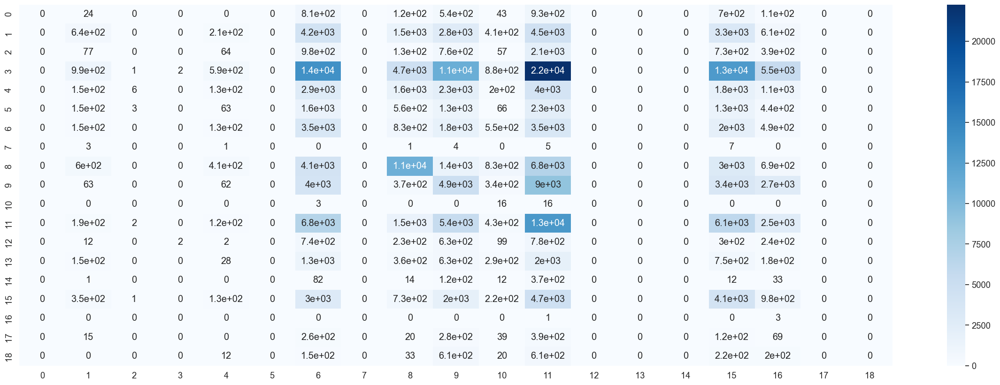

In [168]:
graph_confusion_matrix(clf_MLP, X_train, y_train, X_test, y_test, train=True)

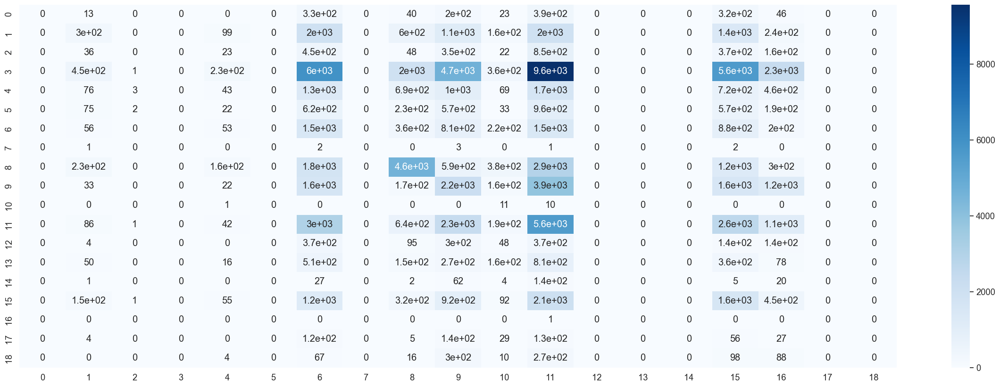

In [169]:
graph_confusion_matrix(clf_MLP, X_train, y_train, X_test, y_test, train=False)

<b>Eliminamos las variables de menor peso</b>

Las variables de menor peso las estudiamos en Random Forest. Aquí las eliminamos del conjunto balanceado para MLP.

In [170]:
X_train_reduced_3 = X_train_balanced.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded', 'publish_trending_days'], axis='columns')

X_train_reduced_3.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded'],
      dtype='object')

In [171]:
X_test_reduced_3 = X_test.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded', 'publish_trending_days'], axis='columns')

X_test_reduced_3.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded'],
      dtype='object')

In [172]:
print('Iterando...')

clf_MLP_reduced = MLPClassifier(**best_params_MLP_gscv)
clf_MLP_reduced.fit(X_train_reduced_3, np.ravel(y_train_balanced))

print('Acabado')

Iterando...
Acabado


Preparamos una versión de los conjuntos originales de entrenamiento y pruebas a la que reducimos las características de menos peso, para usarlas en la evaluación del modelo.

In [173]:
X_train_original_reduced = X_train.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded', 'publish_trending_days'], axis='columns')

X_train_original_reduced.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded'],
      dtype='object')

In [174]:
X_test_original_reduced = X_test.drop(['ratings_disabled', 'trending_date_year_encoded', 'publish_time_year_encoded', 'comments_disabled',  \
                                  'trending_date_month_encoded', 'publish_time_month_encoded', 'publish_trending_days'], axis='columns')

X_test_original_reduced.columns

Index(['channel_title_encoded', 'tags_encoded', 'views_encoded',
       'likes_encoded', 'dislikes_encoded', 'comment_count_encoded',
       'country_encoded', 'ratio_viralidad', 'ratio_interaccion_dia_encoded'],
      dtype='object')

In [175]:
print_score(clf_MLP_reduced, X_train_original_reduced, y_train, X_test, y_test, train=True)

Train Result:
Accuracy Score: 16.32%
_______________________________________________
CLASSIFICATION REPORT:
                0             1       2             3             4       5  \
precision     NaN      0.151200     NaN      0.306489      0.052045     NaN   
recall        0.0      0.044935     0.0      0.073085      0.003989     0.0   
f1-score      0.0      0.069280     0.0      0.118026      0.007410     0.0   
support    3284.0  18093.000000  5310.0  73216.000000  14038.000000  7760.0   

                 6     7             8             9  ...      12  \
precision      0.0   NaN      0.404925      0.129858  ...     NaN   
recall         0.0   0.0      0.425080      0.573937  ...     0.0   
f1-score       0.0   0.0      0.414758      0.211796  ...     0.0   
support    12994.0  21.0  29011.000000  24886.000000  ...  3049.0   

                    13     14            15   16      17           18  \
precision     0.023560    NaN      0.083418  NaN     NaN     0.493506   
reca

In [176]:
print_score(clf_MLP_reduced, X_train_original_reduced, y_train, X_test_original_reduced, y_test, train=False)

Test Result:
Accuracy Score: 16.12%
_______________________________________________
CLASSIFICATION REPORT:
                0            1       2             3            4       5  \
precision     NaN     0.153949     NaN      0.304899     0.040302     NaN   
recall        0.0     0.043737     0.0      0.074037     0.002641     0.0   
f1-score      0.0     0.068121     0.0      0.119143     0.004957     0.0   
support    1364.0  7888.000000  2306.0  31187.000000  6059.000000  3281.0   

                6    7             8             9  ...      12           13  \
precision     0.0  NaN      0.404285      0.131296  ...     NaN     0.019422   
recall        0.0  0.0      0.419487      0.572629  ...     0.0     0.048791   
f1-score      0.0  0.0      0.411746      0.213614  ...     0.0     0.027784   
support    5528.0  9.0  12234.000000  10829.000000  ...  1457.0  2398.000000   

              14           15   16     17          18  accuracy  \
precision    NaN     0.078230  NaN    N

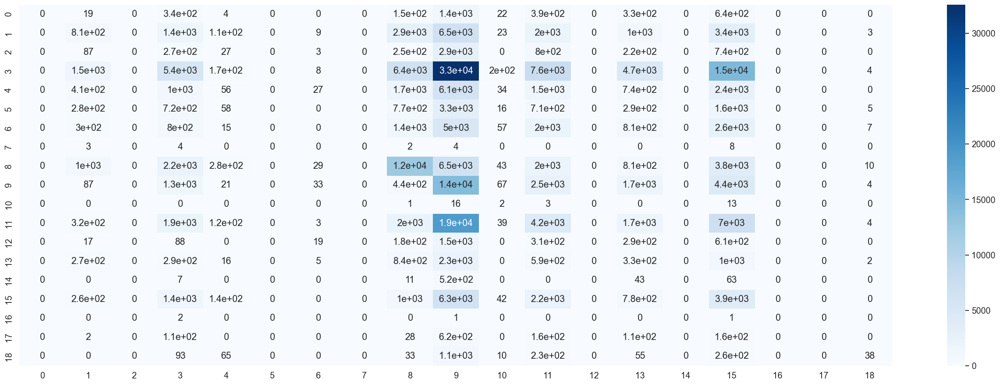

In [177]:
graph_confusion_matrix(clf_MLP_reduced, X_train_original_reduced, y_train, X_test, y_test, train=True)

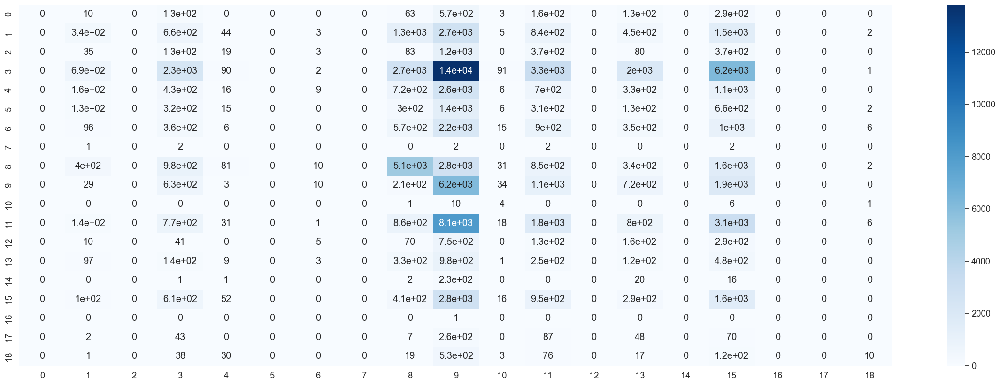

In [178]:
graph_confusion_matrix(clf_MLP_reduced, X_train_original_reduced, y_train, X_test_original_reduced, y_test, train=False)

<b>Resultados de MLP</b>

Los mejores resultados que se obtienen no llegan al 20% de accuracy, con detección de sólo la mitad de las clases. Resultados muy pobres de MLP.

# Conclusiones

Industrializaremos Random Forest, sin duda el método que mejores resultados ha ofrecido para identificar la categoría de los vídeos.